In [9]:
# --- 📦 Package installation and loading ---

# Ensure BiocManager is available
if (!requireNamespace("BiocManager", quietly = TRUE))
    install.packages("BiocManager")

# List of CRAN packages
cran_pkgs <- c(
  "tidyverse", "data.table", "RColorBrewer", "ggrepel",
  "cowplot", "viridis", "ggVennDiagram", "gplots",
  "extrafont", "showtext"
)

# Install any missing CRAN packages
for (pkg in cran_pkgs) {
  if (!requireNamespace(pkg, quietly = TRUE)) {
    install.packages(pkg, repos = "https://cloud.r-project.org")
  }
}

# List of Bioconductor packages
bioc_pkgs <- c(
  "DESeq2", "ComplexHeatmap", "topGO",
  "vsn", "genefilter", "tximport", "pheatmap"
)

# Install any missing Bioconductor packages
for (pkg in bioc_pkgs) {
  if (!requireNamespace(pkg, quietly = TRUE)) {
    BiocManager::install(pkg, ask = FALSE, update = FALSE)
  }
}

# Load all libraries
suppressPackageStartupMessages({
  library(tidyverse)
  library(data.table)
  library(DESeq2)
  library(pheatmap)
  library(ComplexHeatmap)
  library(topGO)
  library(vsn)
  library(genefilter)
  library(tximport)
  library(RColorBrewer)
  library(ggrepel)
  library(ggplot2)
  library(cowplot)
  library(viridis)
  library(ggVennDiagram)
  library(extrafont)
  library(showtext)
  library(gplots)
})

message("✅ All required CRAN and Bioconductor packages are installed and loaded.")





groupGOTerms: 	GOBPTerm, GOMFTerm, GOCCTerm environments built.

✅ All required CRAN and Bioconductor packages are installed and loaded.



In [10]:
if (!requireNamespace("VennDiagram", quietly = TRUE)) {
  install.packages("VennDiagram", repos = "https://cloud.r-project.org")
}
library(VennDiagram); library(grid)


Loading required package: futile.logger



In [11]:
txi <- readRDS("paua_txi_all.rds")

In [12]:
R.version.string
packageVersion("tximport")
packageVersion("DESeq2")


[1] "R version 4.3.3 (2024-02-29)"

[1] ‘1.30.0’

[1] ‘1.42.1’

In [13]:
coldata <- read.table('paua_spring2024_summer2025(1).csv', sep = '\t', header = TRUE, check.names = FALSE)
head(coldata)

,Location,SampleID,before_during_heatwave,length_mm,watertemp_C,Date,seq_ID_dontuse
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<int>
1,Akaroa,AP301C,Before,115,15,22/10/2024,74
2,Akaroa,AP302A,Before,122,15,22/10/2024,75
3,Akaroa,AP303B,Before,115,15,22/10/2024,76
4,Akaroa,AP304C,Before,121,15,22/10/2024,77
5,Akaroa,AP305B,Before,128,15,22/10/2024,78
6,Akaroa,AP306B,Before,117,15,22/10/2024,79


In [14]:
str(txi)


List of 4
 $ abundance          : num [1:585759, 1:87] 4 7.28 285.46 3.99 7.68 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:585759] "TRINITY_DN0_c0_g1" "TRINITY_DN0_c0_g2" "TRINITY_DN0_c1_g1" "TRINITY_DN0_c1_g2" ...
  .. ..$ : chr [1:87] "AP301C" "AP303B" "AP304C" "AP306B" ...
 $ counts             : num [1:585759, 1:87] 98.1 14 1167.2 104 182.4 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:585759] "TRINITY_DN0_c0_g1" "TRINITY_DN0_c0_g2" "TRINITY_DN0_c1_g1" "TRINITY_DN0_c1_g2" ...
  .. ..$ : chr [1:87] "AP301C" "AP303B" "AP304C" "AP306B" ...
 $ length             : num [1:585759, 1:87] 1216.2 95.4 202.8 1291.5 1178.5 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:585759] "TRINITY_DN0_c0_g1" "TRINITY_DN0_c0_g2" "TRINITY_DN0_c1_g1" "TRINITY_DN0_c1_g2" ...
  .. ..$ : chr [1:87] "AP301C" "AP303B" "AP304C" "AP306B" ...
 $ countsFromAbundance: chr "no"


In [15]:
# 0) Load txi if needed
# txi <- readRDS("paua_txi_all.rds")

# 1) Extract a matrix from txi (prefer counts)
if (is.list(txi) && !is.null(txi$counts)) {
  mat <- txi$counts
} else if (is.matrix(txi)) {
  mat <- txi
} else if (is.data.frame(txi)) {
  mat <- as.matrix(txi)
} else {
  stop("Don't know how to extract a matrix from 'txi'. Does it have $counts?")
}

# Quick sanity checks
stopifnot(is.matrix(mat))
if (is.null(colnames(mat))) stop("Matrix has no column names.")

# 2) Collapse technical replicates that end with "__rep<number>"
base_names <- sub("__rep\\d+$", "", colnames(mat))
idx_list <- split(seq_along(base_names), base_names)

# Sum columns within each group, preserving name order
mat_sum <- do.call(cbind, lapply(names(idx_list), function(nm) {
  rowSums(mat[, idx_list[[nm]], drop = FALSE])
}))
colnames(mat_sum) <- names(idx_list)

# 3) Count-based filter for DESeq2
# Keep genes with at least 10 counts in at least 6 samples
min_count   <- 10
min_samples <- 6

keep_cnt <- rowSums(mat_sum >= min_count) >= min_samples
mat_filt <- mat_sum[keep_cnt, , drop = FALSE]


# 4) Inspect and save
cat("Original dims (txi$counts):", paste(dim(mat), collapse = " x "), "\n")
cat("After summing reps:",         paste(dim(mat_sum), collapse = " x "), "\n")
cat("After count filter:",         paste(dim(mat_filt), collapse = " x "), "\n")

# saveRDS(mat_sum,  file = "paua_counts_sumreps.rds")
# saveRDS(mat_filt, file = "paua_counts_sumreps_cnt10_in3.rds")


#saveRDS(mat_sum,  file = "paua_counts_sumreps.rds")
#saveRDS(mat_filt, file = "paua_counts_sumreps_cpm1_atleast2.rds")


Original dims (txi$counts): 585759 x 87 
After summing reps: 585759 x 60 
After count filter: 100331 x 60 


In [16]:

head(mat_filt)

,AP301C,AP302A,AP303B,AP304C,AP305B,AP306B,AP307B,AP308A,AP309B,AP310A,⋯,KP401A,KP402A,KP403A,KP404A,KP405A,KP406A,KP407A,KP408B,KP409A,KP410A
TRINITY_DN0_c0_g1,98.099,83.461,160.200,194.053,251.786,73.060,235.081,221.870,290.363,200.832,⋯,534.047,1231.167,766.391,288.078,125.012,520.915,239.544,23.688,230.360,251.007
TRINITY_DN0_c0_g2,14.005,11.000,22.000,12.000,19.000,28.781,12.000,23.000,41.000,27.000,⋯,22.947,89.000,59.012,18.994,22.536,18.000,14.000,2.000,18.000,28.721
TRINITY_DN0_c1_g1,1167.210,835.687,1084.669,984.411,4234.890,1435.002,976.608,1244.654,3230.952,1445.720,⋯,1929.877,6129.935,3317.966,2792.438,942.621,2409.042,528.581,121.231,2530.493,1154.801
TRINITY_DN0_c1_g2,104.000,103.000,158.000,174.000,287.010,153.003,138.000,156.000,297.000,272.667,⋯,300.064,812.018,537.122,258.000,245.000,253.000,127.193,16.000,214.095,187.000
TRINITY_DN0_c1_g3,182.415,109.000,541.000,0.000,1.000,0.000,185.000,1.000,734.000,0.000,⋯,146.000,357.000,0.000,104.000,148.000,121.000,1.000,20.000,0.000,0.000
TRINITY_DN0_c10_g1,6.000,4.000,8.000,6.000,19.001,12.000,16.000,7.000,32.000,11.000,⋯,20.001,48.755,29.999,19.013,8.000,21.000,13.000,3.000,11.000,19.000


In [17]:
# Check matrix structure
stopifnot(is.matrix(mat_filt))
any_nonint <- any(mat_filt != round(mat_filt))
any_nonint  # should show TRUE if rounding needed

# Round non-integers if needed
if (any_nonint) {
  message("Rounding counts for DESeq2 (original values not integers).")
  mat_filt <- round(mat_filt)
}

# Ensure counts are stored as integers
storage.mode(mat_filt) <- "integer"


[1] TRUE

Rounding counts for DESeq2 (original values not integers).



In [18]:
# Try to auto-detect which column contains the sample IDs
cand <- names(coldata)[sapply(coldata, function(x)
  setequal(as.character(x), colnames(mat_filt)))]

if (length(cand) == 1) {
  rownames(coldata) <- as.character(coldata[[cand]])
} else {
  stop("Couldn't auto-detect the ID column. Please set it manually, e.g.:
       rownames(coldata) <- coldata$SampleID")
}

# Reorder to match the matrix columns
coldata <- coldata[colnames(mat_filt), , drop = FALSE]

# Verify
stopifnot(identical(rownames(coldata), colnames(mat_filt)))


In [19]:
library(DESeq2)

# If counts aren't integers, round them safely
if (any(mat_filt != round(mat_filt))) {
  message("Rounding counts for DESeq2 (original values not integers).")
  mat_filt <- round(mat_filt)
}
storage.mode(mat_filt) <- "integer"


if ("before_during_heatwave" %in% names(coldata)) {
  coldata$before_during_heatwave <- relevel(factor(coldata$before_during_heatwave), ref = "Before")
}

# Build DESeq2 object
dds <- DESeqDataSetFromMatrix(
  countData = mat_filt,
  colData   = coldata,
  design    = ~ Location + before_during_heatwave
)

# Light prefilter (recommended)
keep <- rowSums(counts(dds) >= 10) >= 2
dds <- dds[keep,]

# Run DESeq
dds <- DESeq(dds)

# Example: During vs Before
res <- results(dds, contrast = c("before_during_heatwave", "During", "Before"))
head(res)
summary(res)

# Optional: save objects for later
#saveRDS(dds, "dds_from_mat_filt.rds")
vsd <- vst(dds, blind = TRUE)
#saveRDS(vsd, "vsd_from_mat_filt_vst.rds")


Warning message in DESeqDataSet(se, design = design, ignoreRank):
“some variables in design formula are characters, converting to factors”
estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

-- replacing outliers and refitting for 1503 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



log2 fold change (MLE): before_during_heatwave During vs Before 
Wald test p-value: before during heatwave During vs Before 
DataFrame with 6 rows and 6 columns
                    baseMean log2FoldChange     lfcSE      stat      pvalue
                   <numeric>      <numeric> <numeric> <numeric>   <numeric>
TRINITY_DN0_c0_g1   230.5627     0.35508147 0.1002206  3.542999 0.000395604
TRINITY_DN0_c0_g2    22.1425     0.23887511 0.1131861  2.110462 0.034818547
TRINITY_DN0_c1_g1  1648.4288     0.02310808 0.1538280  0.150220 0.880590875
TRINITY_DN0_c1_g2   205.7753     0.00835963 0.0585761  0.142714 0.886516113
TRINITY_DN0_c1_g3    86.9600    -0.24421397 1.0136622 -0.240922 0.809615223
TRINITY_DN0_c10_g1   13.4727     0.13704827 0.1328496  1.031604 0.302257485
                         padj
                    <numeric>
TRINITY_DN0_c0_g1  0.00480524
TRINITY_DN0_c0_g2  0.14002083
TRINITY_DN0_c1_g1  0.95039235
TRINITY_DN0_c1_g2  0.95314858
TRINITY_DN0_c1_g3  0.91762977
TRINITY_DN0_c10_g1 0.


out of 100331 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)       : 8021, 8%
LFC < 0 (down)     : 13768, 14%
outliers [1]       : 0, 0%
low counts [2]     : 0, 0%
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [20]:
# Bigger inline figures in Jupyter (IRkernel)
options(repr.plot.width = 16,  # inches
        repr.plot.height = 9,
        repr.plot.res = 200)   # DPI for inline display


using ntop=500 top features by variance



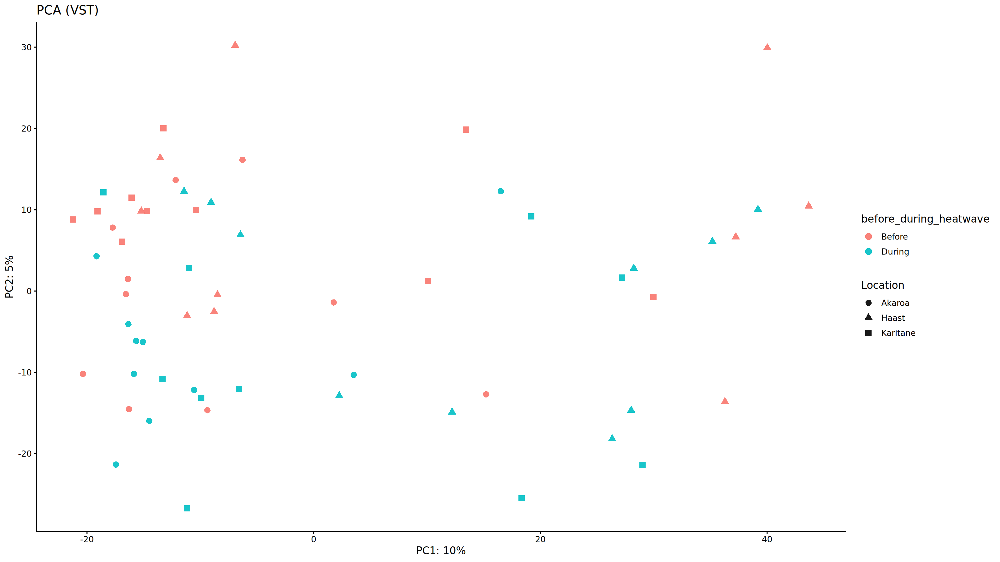

In [21]:
# 1) VST (variance-stabilizing transform)
library(DESeq2)
vsd <- vst(dds, blind = TRUE)

# 2) PCA using DESeq2's helper (returns a ggplot)
intgroups <- intersect(c("before_during_heatwave","Location"), names(colData(vsd)))
if (length(intgroups) == 0) intgroups <- NULL

pca_df <- plotPCA(vsd, intgroup = intgroups, returnData = TRUE)
percentVar <- round(100 * attr(pca_df, "percentVar"))

if (requireNamespace("ggplot2", quietly = TRUE)) {
  library(ggplot2)
  p <- ggplot(pca_df, aes(PC1, PC2)) +
    geom_point(aes(color = before_during_heatwave, shape = Location), size = 3, alpha = 0.9, na.rm = TRUE) +
    labs(x = paste0("PC1: ", percentVar[1], "%"), 
         y = paste0("PC2: ", percentVar[2], "%"),
         title = "PCA (VST)") +
    theme_classic(base_size = 12)
  print(p)
} else {
  # minimal base-R fallback (no ggplot2)
  plot(pca_df$PC1, pca_df$PC2,
       xlab = paste0("PC1: ", percentVar[1], "%"),
       ylab = paste0("PC2: ", percentVar[2], "%"),
       main = "PCA (VST)",
       pch = 19)
  text(pca_df$PC1, pca_df$PC2, labels = rownames(pca_df), pos = 3, cex = 0.6)
}


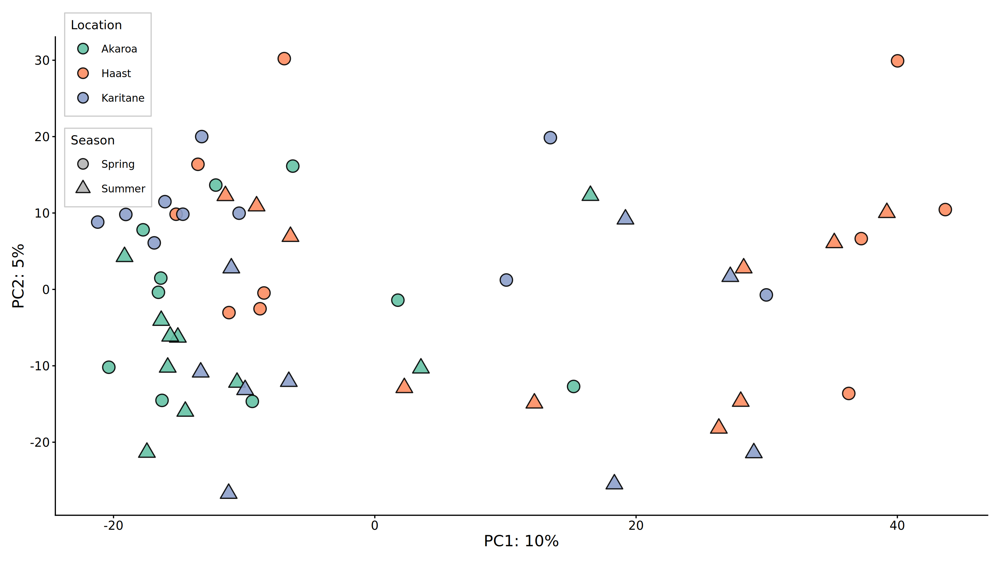

In [22]:
if (requireNamespace("ggplot2", quietly = TRUE)) {
  library(ggplot2)

  # Relabel seasons
  pca_df$Season <- ifelse(pca_df$before_during_heatwave == "Before", "Spring", "Summer")

  p <- ggplot(pca_df, aes(PC1, PC2)) +
    geom_point(aes(fill = Location, shape = Season),
               colour = "black",
               size = 6,
               stroke = 1,
               alpha = 0.9,
               na.rm = TRUE) +
    labs(
      x = paste0("PC1: ", percentVar[1], "%"),
      y = paste0("PC2: ", percentVar[2], "%"),
      fill = "Location",
      shape = "Season"
    ) +
    scale_shape_manual(values = c("Spring" = 21, "Summer" = 24)) +
    scale_fill_brewer(palette = "Set2") +
    theme_classic(base_size = 14) +
    theme(
      axis.title = element_text(size = 18),
      axis.text  = element_text(size = 14),
      plot.title = element_blank(),
      plot.margin = grid::unit(c(1.5, 0.5, 0.5, 0.5), "cm"),
      legend.position = c(0.01, 1.05),
      legend.justification = c("left", "top"),
      legend.background = element_rect(fill = "white", colour = "grey80"),
      legend.title = element_text(size = 14),
      legend.text  = element_text(size = 12),
      legend.key.size = grid::unit(10, "mm")
    ) +
    guides(
      fill = guide_legend(
        override.aes = list(shape = 21, colour = "black", size = 5)
      ),
      shape = guide_legend(
        override.aes = list(fill = "grey70", colour = "black", size = 5)
      )
    )

  print(p)
}


In [23]:
# Save PCA plot with Jupyter-like dimensions and high resolution
ggsave("PCA_VST_filter.svg", plot = p, width = 18, height = 9)   # SVG = vector, no DPI needed
ggsave("PCA_VST_filter.png", plot = p, width = 18, height = 9, dpi = 600)  # very high quality PNG


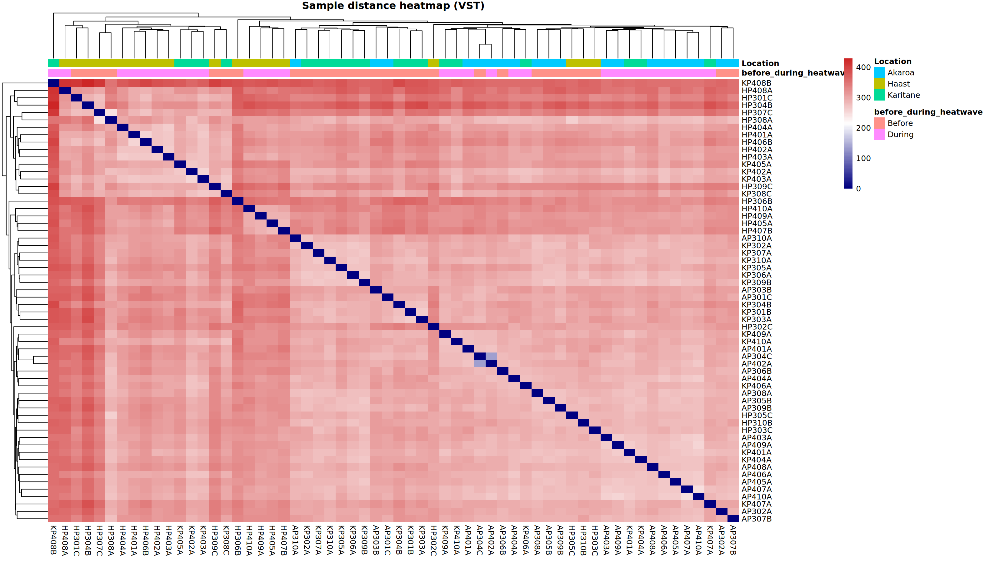

In [24]:
# distances between samples on the VST scale
vsd_mat <- assay(vsd)
d <- dist(t(vsd_mat))              # Euclidean distance
d_mat <- as.matrix(d)

# optional: simple annotation from your colData
ann <- as.data.frame(colData(vsd)[, intersect(c("before_during_heatwave","Location"), names(colData(vsd))), drop = FALSE])

# color palette (no extra deps)
pal <- colorRampPalette(c("navy", "white", "firebrick3"))

if (requireNamespace("pheatmap", quietly = TRUE)) {
  pheatmap::pheatmap(d_mat,
                     clustering_distance_rows = d,
                     clustering_distance_cols = d,
                     color = pal(100),
                     annotation_col = if (ncol(ann)) ann else NULL,
                     main = "Sample distance heatmap (VST)",
                     fontsize = 9, border_color = NA)
} else {
  # base heatmap fallback
  heatmap(d_mat,
          distfun = function(x) as.dist(x),
          symm = TRUE,
          col = pal(100),
          main = "Sample distance heatmap (VST)")
}


In [25]:
# --- Akaroa subset: clean DE fit for volcano ---

# Subset
dds_ak <- dds[, dds$Location == "Akaroa"]

# Drop unused levels
dds_ak$Location <- droplevels(dds_ak$Location)
dds_ak$before_during_heatwave <- droplevels(dds_ak$before_during_heatwave)

# Ensure both levels exist
tbl_ak <- table(dds_ak$before_during_heatwave)
if (length(tbl_ak) < 2) {
  stop("Akaroa subset has only one level of 'before_during_heatwave': ", paste(names(tbl_ak), collapse = ", "))
}

# Set reference and design ONCE, then fit
dds_ak$before_during_heatwave <- relevel(dds_ak$before_during_heatwave, ref = "Before")
design(dds_ak) <- ~ before_during_heatwave
dds_ak <- DESeq(dds_ak)

# Results (During vs Before)
res_ak <- results(dds_ak, contrast = c("before_during_heatwave", "During", "Before"))

# (Optional) VST for PCA/heatmaps
# vsd_ak <- vst(dds_ak, blind = TRUE)


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

-- replacing outliers and refitting for 4030 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



using ntop=500 top features by variance



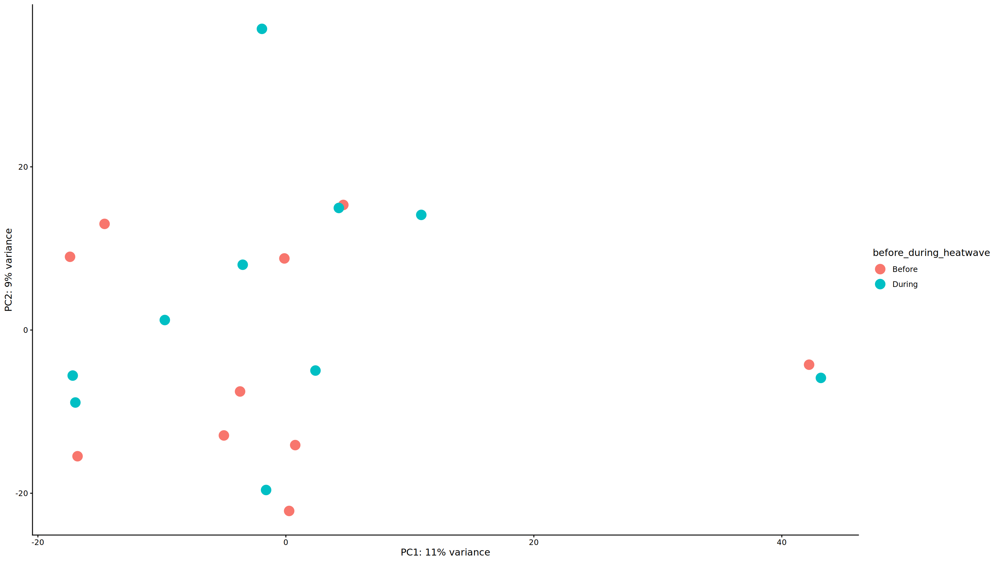

In [28]:


## 2) VST on the subset
vsd_ak <- vst(dds_ak, blind = TRUE)

## 3) PCA (color by Date)
pcaData_ak <- plotPCA(vsd_ak, intgroup = "before_during_heatwave", returnData = TRUE)
percentVar <- round(100 * attr(pcaData_ak, "percentVar"))

ggplot(pcaData_ak, aes(PC1, PC2, color = before_during_heatwave)) +
  geom_point(size = 5) +
  xlab(paste0("PC1: ", percentVar[1], "% variance")) +
  ylab(paste0("PC2: ", percentVar[2], "% variance")) +
  theme_classic()

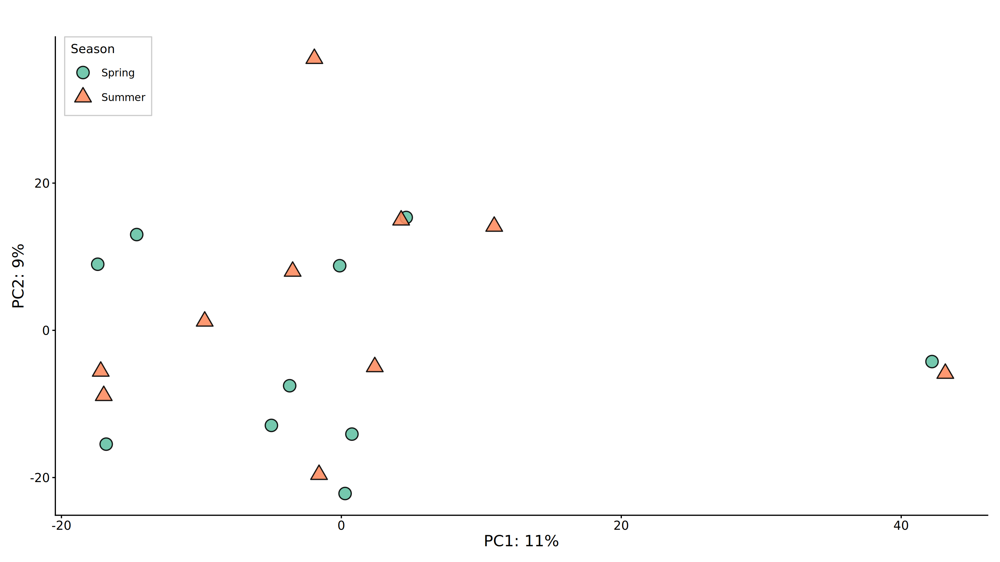

In [29]:
library(ggplot2)

# Relabel seasons for Akaroa subset
pcaData_ak$Season <- ifelse(pcaData_ak$before_during_heatwave == "Before",
                            "Spring", "Summer")

ggplot(pcaData_ak, aes(PC1, PC2)) +
  geom_point(aes(fill = Season, shape = Season),
             colour = "black",
             size = 6,
             stroke = 1,
             alpha = 0.9,
             na.rm = TRUE) +
  labs(
    x = paste0("PC1: ", percentVar[1], "%"),
    y = paste0("PC2: ", percentVar[2], "%"),
    fill  = "Season",
    shape = "Season"
  ) +
  scale_shape_manual(values = c(Spring = 21, Summer = 24)) +
  scale_fill_brewer(palette = "Set2") +
  theme_classic(base_size = 14) +
  theme(
    axis.title = element_text(size = 18),
    axis.text  = element_text(size = 14),
    plot.title = element_blank(),
    plot.margin = grid::unit(c(1.5, 0.5, 0.5, 0.5), "cm"),
    legend.position = c(0.01, 1.0),
    legend.justification = c("left", "top"),
    legend.background = element_rect(fill = "white", colour = "grey80"),
    legend.title = element_text(size = 14),
    legend.text  = element_text(size = 12),
    legend.key.size = grid::unit(10, "mm")
  ) +
  guides(
    fill = guide_legend(
      override.aes = list(shape = c(21, 24),
                          colour = "black",
                          size = 6)
    ),
    shape = "none"   # hides duplicate legend
  )


In [30]:
# Save as PNG (high resolution)
ggsave(
  filename = "PCA_Akaroa_vst.png",
  width = 18,    # inches
  height = 9,
  dpi = 300,
  units = "in"
)

# Save as SVG (for vector figure editing)
ggsave(
  filename = "PCA_Akaroa_vst.svg",
  width = 18,
  height = 9,
  units = "in"
)


Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Sample distance heatmap (VST) — Akaroa' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Sample distance heatmap (VST) — Akaroa' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Sample distance heatmap (VST) — Akaroa' in 'mbcsToSbcs': dot substituted for <94>”


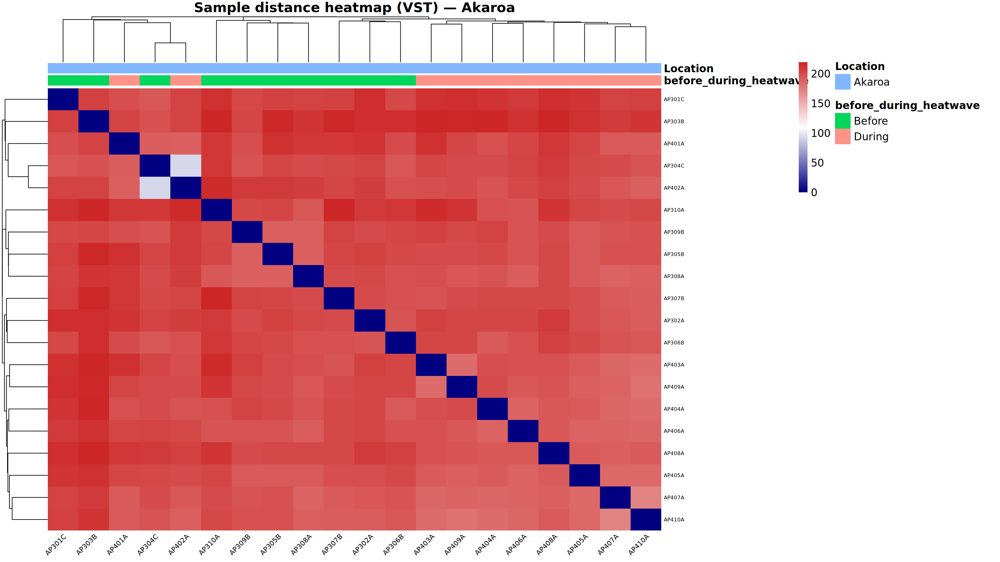

In [32]:
# 1) Distance on VST expression (samples = columns)
vsd_mat_ak <- assay(vsd_ak)
d_ak <- dist(t(vsd_mat_ak))         # Euclidean distance between samples
dmat_ak <- as.matrix(d_ak)

# 2) Optional annotation for heatmap side bars
ann_ak <- as.data.frame(colData(vsd_ak)[, 
  intersect(c("before_during_heatwave","Location"), names(colData(vsd_ak))), drop = FALSE])

# 3) Plot (uses pheatmap if available; else base heatmap)
pal <- colorRampPalette(c("navy", "white", "firebrick3"))

if (requireNamespace("pheatmap", quietly = TRUE)) {
  pheatmap::pheatmap(
    dmat_ak,
    clustering_distance_rows = d_ak,
    clustering_distance_cols = d_ak,
    color = pal(150),
    annotation_col = if (ncol(ann_ak)) ann_ak else NULL,
    main = "Sample distance heatmap (VST) — Akaroa",
    fontsize = 12,
    fontsize_row = 6,
    fontsize_col = 8,
    border_color = NA,
    angle_col = 45        # tilt column labels if many samples
  )
} else {
  heatmap(dmat_ak, symm = TRUE, col = pal(150), main = "Sample distance heatmap (VST) — Akaroa")
}


Warning message:
“Removed 4053 rows containing missing values or values outside the scale range (`geom_point()`).”


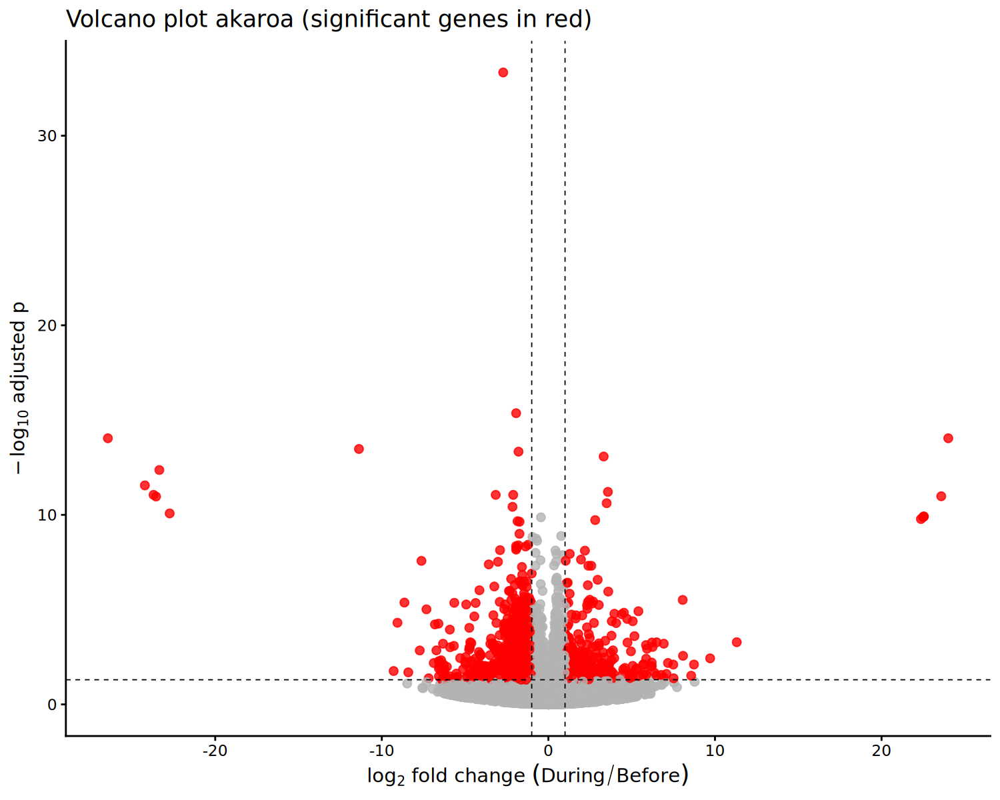

In [33]:
# Use results already computed from DESeq2
res_ak <- results(dds_ak, contrast = c("before_during_heatwave", "During", "Before"))

# Prep data frame
vdf_ak <- as.data.frame(res_ak)
vdf_ak$neglog10padj <- -log10(vdf_ak$padj)

# thresholds
padj_thr <- 0.05
lfc_thr  <- 1

# significance flag
vdf_ak$sig <- with(vdf_ak,
  ifelse(!is.na(padj) & padj < padj_thr & abs(log2FoldChange) >= lfc_thr, "sig", "ns")
)

# bigger plots in Jupyter
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 150)

# basic volcano
ggplot(vdf_ak, aes(x = log2FoldChange, y = neglog10padj)) +
  geom_point(aes(color = sig), size = 2.5, alpha = 0.8) +
  scale_color_manual(values = c("ns" = "grey70", "sig" = "red")) +
  geom_vline(xintercept = c(-lfc_thr, lfc_thr), linetype = 2, linewidth = 0.4) +
  geom_hline(yintercept = -log10(padj_thr), linetype = 2, linewidth = 0.4) +
  labs(
    x = expression(log[2]~fold~change~(During/Before)),
    y = expression(-log[10]~adjusted~p),
    title = "Volcano plot akaroa (significant genes in red)"
  ) +
  theme_classic(base_size = 14) +
  theme(legend.position = "none")


Warning message in scan(file = file, what = what, sep = sep, quote = quote, dec = dec, :
“EOF within quoted string”
Warning message in scan(file = file, what = what, sep = sep, quote = quote, dec = dec, :
“number of items read is not a multiple of the number of columns”
Warning message:
“Removed 4053 rows containing missing values or values outside the scale range (`geom_point()`).”


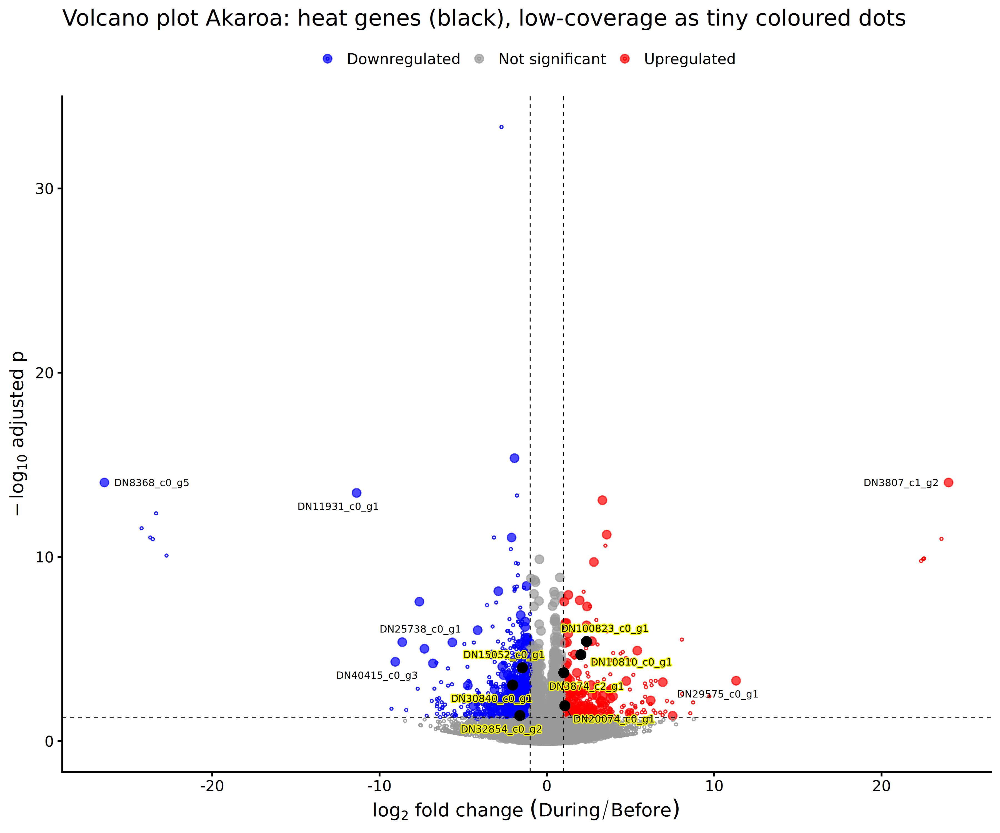

In [79]:
library(ggplot2)
library(ggrepel)

options(repr.plot.width = 12, repr.plot.height = 10, repr.plot.res = 300)

padj_thr <- 0.05
lfc_thr  <- 1

# Base DF
vdf_ak <- as.data.frame(res_ak)
vdf_ak$gene <- rownames(vdf_ak)
vdf_ak$neglog10padj <- -log10(vdf_ak$padj)

# Load heat genes
heat_genes <- read.table("by_heat_only.tsv", sep = "\t", header = FALSE)$V1
heat_genes <- unique(trimws(gsub("'", "", heat_genes)))

# Significant?
is_sig <- !is.na(vdf_ak$padj) &
          vdf_ak$padj < padj_thr &
          abs(vdf_ak$log2FoldChange) >= lfc_thr

# Significant heat genes
heat_sig_genes <- vdf_ak$gene[is_sig & vdf_ak$gene %in% heat_genes]

# Top 10 sig up/down
sig_df <- vdf_ak[is_sig, , drop = FALSE]
top10_pos <- head(sig_df[order(sig_df$log2FoldChange, decreasing = TRUE), "gene"], 10)
top10_neg <- head(sig_df[order(sig_df$log2FoldChange, decreasing = FALSE), "gene"], 10)

# Labels
vdf_ak$label_heat  <- ifelse(vdf_ak$gene %in% heat_sig_genes, vdf_ak$gene, NA)
vdf_ak$label_top10 <- ifelse(
  vdf_ak$gene %in% c(top10_pos, top10_neg) & vdf_ak$baseMean >= 50,
  vdf_ak$gene, NA
)

vdf_ak$label_heat  <- sub("^TRINITY_", "", vdf_ak$label_heat)
vdf_ak$label_top10 <- sub("^TRINITY_", "", vdf_ak$label_top10)

# Direction group
vdf_ak$direction <- with(
  vdf_ak,
  ifelse(!is.na(padj) & padj < padj_thr & log2FoldChange >=  lfc_thr, "Upregulated",
  ifelse(!is.na(padj) & padj < padj_thr & log2FoldChange <= -lfc_thr, "Downregulated",
         "Not significant"))
)

# Split for clean layering
df_low  <- subset(vdf_ak, baseMean < 50)
df_high <- subset(vdf_ak, baseMean >= 50)

p <- ggplot() +

  # -----------------------------------
  # 1. High coverage points (big dots)
  # -----------------------------------
  geom_point(
    data = df_high,
    aes(x = log2FoldChange, y = neglog10padj, colour = direction),
    size = 3,
    alpha = 0.7
  ) +

  # -----------------------------------
  # 2. Low coverage points (tiny dots, coloured)
  # -----------------------------------
  geom_point(
    data = df_low,
    aes(x = log2FoldChange, y = neglog10padj, colour = direction),
    size = 0.7,
    alpha = 0.9, shape=1
  ) +

  # -----------------------------------
  # 3. Heat genes (big black points)
  # -----------------------------------
  geom_point(
    data = subset(vdf_ak, gene %in% heat_sig_genes),
    aes(x = log2FoldChange, y = neglog10padj),
    size   = 4,
    colour = "black",
    shape  = 16
  ) +

  # -----------------------------------
  # 4. Labels
  # -----------------------------------
  geom_text_repel(
    data = subset(vdf_ak, !is.na(label_heat)),
    aes(x = log2FoldChange, y = neglog10padj, label = label_heat),
    size = 3,
    box.padding = 0.5,
    point.padding = 0.4,
    max.overlaps = Inf,
    segment.size = 0.3,
    colour = "black",  bg.color = "yellow",
    bg.r = 0.15
  ) +

  geom_text_repel(
    data = subset(vdf_ak, !is.na(label_top10)),
    aes(x = log2FoldChange, y = neglog10padj, label = label_top10),
    size = 3,
    box.padding = 0.5,
    point.padding = 0.4,
    max.overlaps = Inf,
    segment.size = 0.3
  ) +

  # -----------------------------------
  # Colours, theme, axes
  # -----------------------------------
  scale_color_manual(
    values = c(
      "Upregulated"     = "red",
      "Downregulated"   = "blue",
      "Not significant" = "grey60"
    )
  ) +

  geom_vline(xintercept = c(-lfc_thr, lfc_thr), linetype = 2, linewidth = 0.4) +
  geom_hline(yintercept = -log10(padj_thr),     linetype = 2, linewidth = 0.4) +

  labs(
    x = expression(log[2]~fold~change~(During/Before)),
    y = expression(-log[10]~adjusted~p),
    title = "Volcano plot Akaroa: heat genes (black), low-coverage as tiny coloured dots"
  ) +
  theme_classic(base_size = 16) +
  theme(
    legend.position = "top",
    legend.title = element_blank()
  )

p


In [80]:
ggsave("akaroa_volcano_labeled.png", plot = p, width = 14, height = 10, dpi = 300)


Warning message:
“Removed 4053 rows containing missing values or values outside the scale range (`geom_point()`).”


In [57]:
head(heat_genes)

[1] "TRINITY_DN10009_c0_g1"  "TRINITY_DN100292_c0_g1" "TRINITY_DN100589_c0_g1"
[4] "TRINITY_DN100823_c0_g1" "TRINITY_DN10158_c0_g3"  "TRINITY_DN101731_c0_g1"

In [41]:
# Make a plain data frame and keep gene IDs
res_ak_df <- as.data.frame(res_ak)
res_ak_df$gene <- rownames(res_ak_df)
# Logical index for genes passing your volcano thresholds
ok <- !is.na(res_ak_df$padj) &
      res_ak_df$padj < padj_thr &
      abs(res_ak_df$log2FoldChange) >= lfc_thr

# Indices of those genes, ordered by padj
idx <- which(ok)
idx <- idx[order(res_ak_df$padj[idx])]

# Keep the first 50
idx_top50 <- head(idx, 50)

top50 <- res_ak_df[idx_top50, ]
top50_genes <- top50$gene
summary(top50$baseMean)


    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
   7.666   17.820   33.297  162.706   53.655 2114.669 

In [42]:
library(dplyr)
library(tibble)

# top 50 by absolute log2FC (ignore NA)
top50_genes <- vdf_ak %>%
  rownames_to_column(var = "gene") %>%
  filter(!is.na(log2FoldChange)) %>%
  arrange(desc(abs(log2FoldChange))) %>%
  slice_head(n = 50) %>%
  pull(gene)

top50_genes


ERROR: [1m[33mError[39m in `rownames_to_column()`:[22m
[1m[22m[33m![39m Column name `gene` must not be duplicated.
[1mCaused by error in `repaired_names()`:[22m
[33m![39m Names must be unique.
[31m✖[39m These names are duplicated:
  * "gene" at locations 7 and 13.


In [43]:
norm_counts <- counts(dds_ak, normalized = TRUE)
top50_counts <- norm_counts[ intersect(top50_genes, rownames(norm_counts)), , drop = FALSE ]

# quick peek
head(top50_counts)


,AP301C,AP302A,AP303B,AP304C,AP305B,AP306B,AP307B,AP308A,AP309B,AP310A,AP401A,AP402A,AP403A,AP404A,AP405A,AP406A,AP407A,AP408A,AP409A,AP410A
TRINITY_DN1083_c1_g1,79.787669,58.89403,84.79006,65.35238,46.96604,40.943943,45.47941,62.853370,73.54159,66.10018,5.039503,14.731697,11.983711,10.69915,5.6924142,9.408574,13.239638,9.373281,5.3910052,9.0444957
TRINITY_DN8901_c0_g2,121.581209,155.08761,278.98666,148.52813,132.82585,90.417874,75.27626,169.513633,177.93980,107.51233,44.095651,39.284525,39.279942,26.26155,35.1032208,54.280233,29.789185,43.741979,36.7568535,34.7191933
TRINITY_DN3807_c1_g2,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.00000,0.000000,0.00000,0.00000,330.087447,0.000000,0.000000,0.00000,0.9487357,377.066687,68.956446,0.000000,286.7034574,0.0000000
TRINITY_DN8368_c0_g5,0.000000,0.00000,0.00000,0.00000,1815.53117,0.000000,0.00000,226.653060,308.05185,0.00000,0.000000,0.000000,0.000000,0.00000,0.0000000,227.976980,0.000000,0.000000,0.0000000,0.0000000
TRINITY_DN11931_c0_g1,3.799413,26745.74136,2432.92775,0.00000,3389.62752,1.705998,10.97779,1.904648,23.65674,1276.60942,2.519752,1.636855,1.331523,0.97265,2.8462071,0.000000,1.654955,0.000000,0.9801828,0.8752738
TRINITY_DN2841_c5_g1,55.091485,68.70970,45.13019,62.97593,43.29682,56.297921,37.63813,45.711542,67.37027,69.28573,13.858633,5.728993,20.638614,11.67180,24.6671281,13.750992,12.136334,24.995417,20.5838380,14.0043805


In [44]:
# --- Karitane subset: clean DE fit for volcano ---

# Subset
dds_ka <- dds[, dds$Location == "Karitane"]

# Drop unused levels
dds_ka$Location <- droplevels(dds_ka$Location)
dds_ka$before_during_heatwave <- droplevels(dds_ka$before_during_heatwave)

# Ensure both levels exist
tbl_ka <- table(dds_ka$before_during_heatwave)
if (length(tbl_ka) < 2) {
  stop("Karitane subset has only one level of 'before_during_heatwave': ", paste(names(tbl_ka), collapse = ", "))
}

# Set reference and design ONCE, then fit
dds_ka$before_during_heatwave <- relevel(dds_ka$before_during_heatwave, ref = "Before")
design(dds_ka) <- ~ before_during_heatwave
dds_ka <- DESeq(dds_ka)

# Results (During vs Before)
res_ka <- results(dds_ka, contrast = c("before_during_heatwave", "During", "Before"))

# (Optional) VST
# vsd_ka <- vst(dds_ka, blind = TRUE)


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

mean-dispersion relationship

-- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.

final dispersion estimates

fitting model and testing

-- replacing outliers and refitting for 3758 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



In [45]:
# Bigger inline figures in Jupyter (IRkernel)
options(repr.plot.width = 16,  # inches
        repr.plot.height = 9,
        repr.plot.res = 200)   # DPI for inline display


using ntop=500 top features by variance



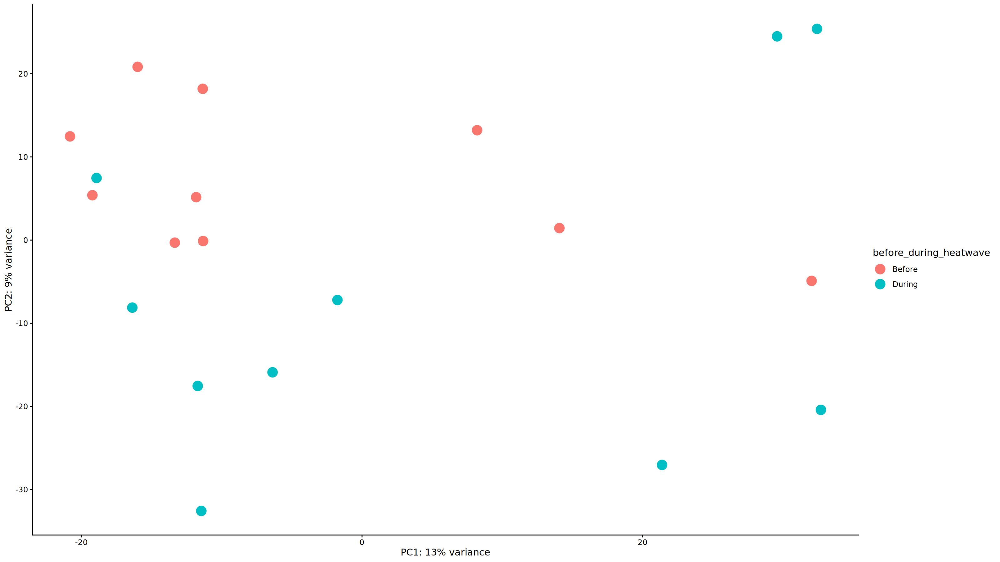

In [46]:

## 2) VST on the subset
vsd_ka <- vst(dds_ka, blind = TRUE)

## 3) PCA (color by Date)
pcaData_ka <- plotPCA(vsd_ka, intgroup = "before_during_heatwave", returnData = TRUE)
percentVar <- round(100 * attr(pcaData_ka, "percentVar"))

ggplot(pcaData_ka, aes(PC1, PC2, color = before_during_heatwave)) +
  geom_point(size = 5) +
  xlab(paste0("PC1: ", percentVar[1], "% variance")) +
  ylab(paste0("PC2: ", percentVar[2], "% variance")) +
  theme_classic()

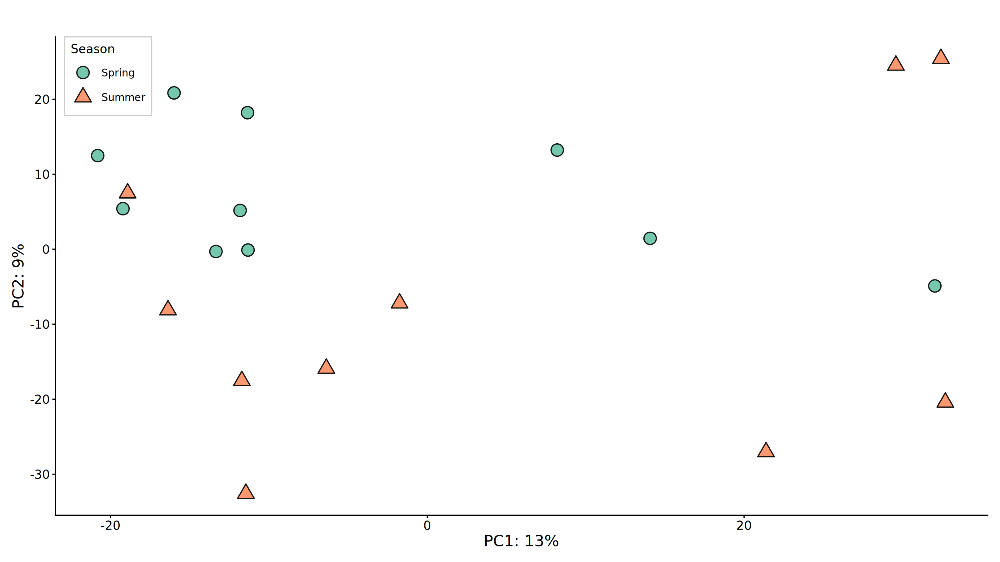

In [47]:
library(ggplot2)

# Relabel seasons for Akaroa subset
pcaData_ka$Season <- ifelse(pcaData_ka$before_during_heatwave == "Before",
                            "Spring", "Summer")

ggplot(pcaData_ka, aes(PC1, PC2)) +
  geom_point(aes(fill = Season, shape = Season),
             colour = "black",
             size = 6,
             stroke = 1,
             alpha = 0.9,
             na.rm = TRUE) +
  labs(
    x = paste0("PC1: ", percentVar[1], "%"),
    y = paste0("PC2: ", percentVar[2], "%"),
    fill  = "Season",
    shape = "Season"
  ) +
  scale_shape_manual(values = c(Spring = 21, Summer = 24)) +
  scale_fill_brewer(palette = "Set2") +
  theme_classic(base_size = 14) +
  theme(
    axis.title = element_text(size = 18),
    axis.text  = element_text(size = 14),
    plot.title = element_blank(),
    plot.margin = grid::unit(c(1.5, 0.5, 0.5, 0.5), "cm"),
    legend.position = c(0.01, 1),
    legend.justification = c("left", "top"),
    legend.background = element_rect(fill = "white", colour = "grey80"),
    legend.title = element_text(size = 14),
    legend.text  = element_text(size = 12),
    legend.key.size = grid::unit(10, "mm")
  ) +
  guides(
    fill = guide_legend(
      override.aes = list(shape = c(21, 24),
                          colour = "black",
                          size = 6)
    ),
    shape = "none"   # hides duplicate legend
  )


In [48]:
# Save as PNG (high resolution)
ggsave(
  filename = "PCA_ka_vst.png",
  width = 18,    # inches
  height = 9,
  dpi = 300,
  units = "in"
)

# Save as SVG (for vector figure editing)
ggsave(
  filename = "PCA_ka_vst.svg",
  width = 18,
  height = 9,
  units = "in"
)


Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Sample distance heatmap (VST) — Karitane' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Sample distance heatmap (VST) — Karitane' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Sample distance heatmap (VST) — Karitane' in 'mbcsToSbcs': dot substituted for <94>”


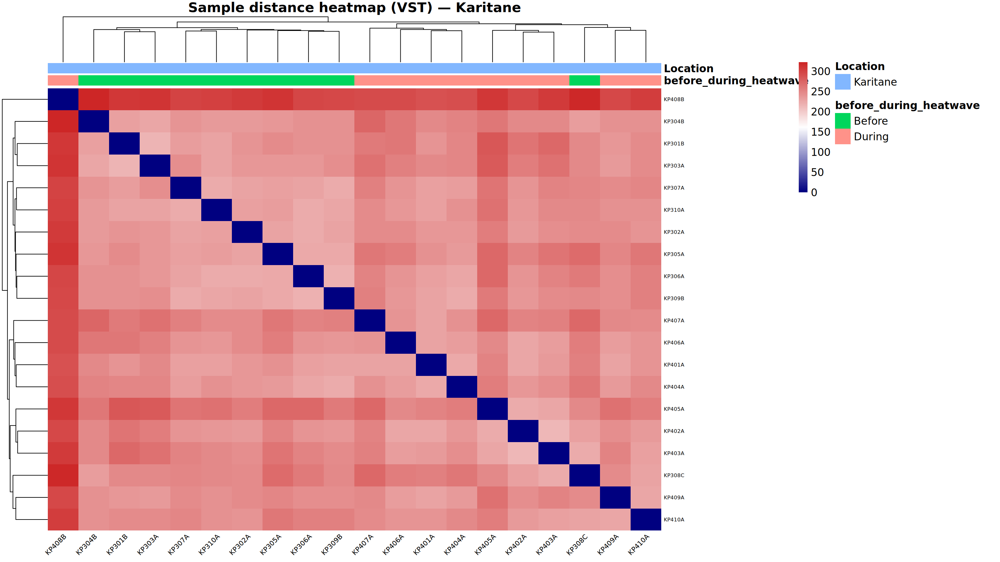

In [49]:
# 1) Distance on VST expression (samples = columns)
vsd_mat_ka <- assay(vsd_ka)
d_ka <- dist(t(vsd_mat_ka))         # Euclidean distance between samples
dmat_ka <- as.matrix(d_ka)

# 2) Optional annotation for heatmap side bars
ann_ka <- as.data.frame(colData(vsd_ka)[, 
  intersect(c("before_during_heatwave","Location"), names(colData(vsd_ka))), drop = FALSE])

# 3) Plot (uses pheatmap if available; else base heatmap)
pal <- colorRampPalette(c("navy", "white", "firebrick3"))

if (requireNamespace("pheatmap", quietly = TRUE)) {
  pheatmap::pheatmap(
    dmat_ka,
    clustering_distance_rows = d_ka,
    clustering_distance_cols = d_ka,
    color = pal(150),
    annotation_col = if (ncol(ann_ka)) ann_ka else NULL,
    main = "Sample distance heatmap (VST) — Karitane",
    fontsize = 12,
    fontsize_row = 6,
    fontsize_col = 8,
    border_color = NA,
    angle_col = 45        # tilt column labels if many samples
  )
} else {
  heatmap(dmat_ka, symm = TRUE, col = pal(150), main = "Sample distance heatmap (VST) — Karitane")
}

Warning message:
“Removed 151 rows containing missing values or values outside the scale range (`geom_point()`).”


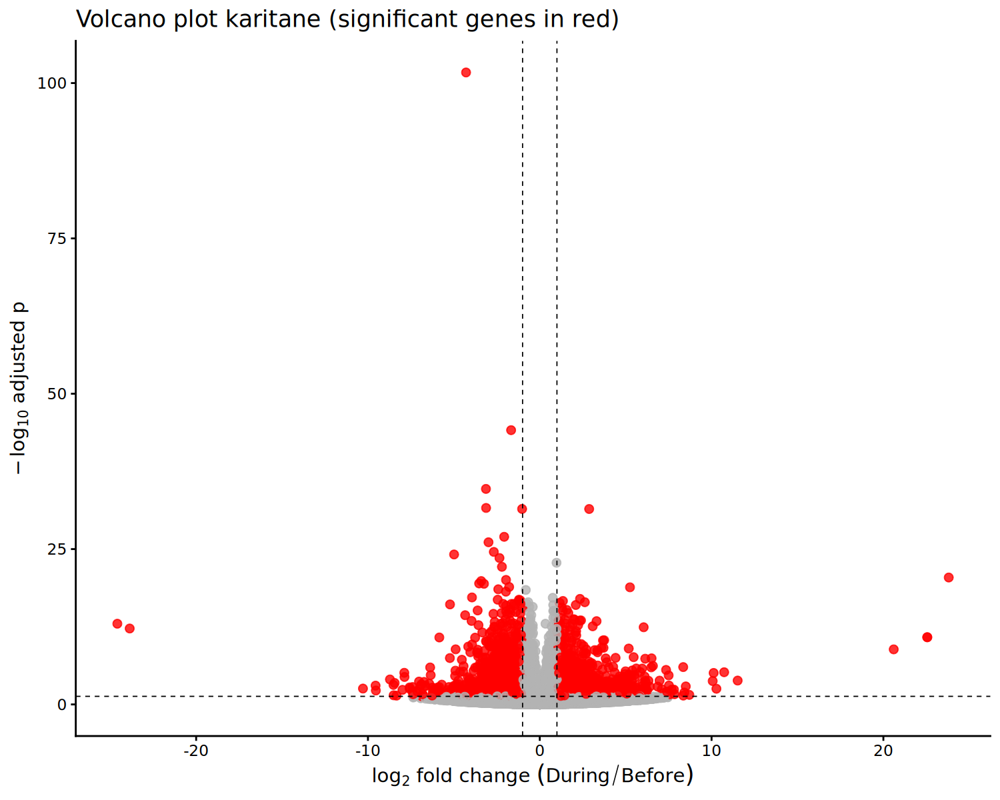

In [50]:
# Use results already computed from DESeq2
res_ka <- results(dds_ka, contrast = c("before_during_heatwave", "During", "Before"))

# Prep data frame
vdf_ka <- as.data.frame(res_ka)
vdf_ka$neglog10padj <- -log10(vdf_ka$padj)

# thresholds
padj_thr <- 0.05
lfc_thr  <- 1

# significance flag
vdf_ka$sig <- with(vdf_ka,
  ifelse(!is.na(padj) & padj < padj_thr & abs(log2FoldChange) >= lfc_thr, "sig", "ns")
)

# bigger plots in Jupyter
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 150)

# basic volcano
ggplot(vdf_ka, aes(x = log2FoldChange, y = neglog10padj)) +
  geom_point(aes(color = sig), size = 2.5, alpha = 0.8) +
  scale_color_manual(values = c("ns" = "grey70", "sig" = "red")) +
  geom_vline(xintercept = c(-lfc_thr, lfc_thr), linetype = 2, linewidth = 0.4) +
  geom_hline(yintercept = -log10(padj_thr), linetype = 2, linewidth = 0.4) +
  labs(
    x = expression(log[2]~fold~change~(During/Before)),
    y = expression(-log[10]~adjusted~p),
    title = "Volcano plot karitane (significant genes in red)"
  ) +
  theme_classic(base_size = 14) +
  theme(legend.position = "none")

Warning message:
“Removed 151 rows containing missing values or values outside the scale range (`geom_point()`).”


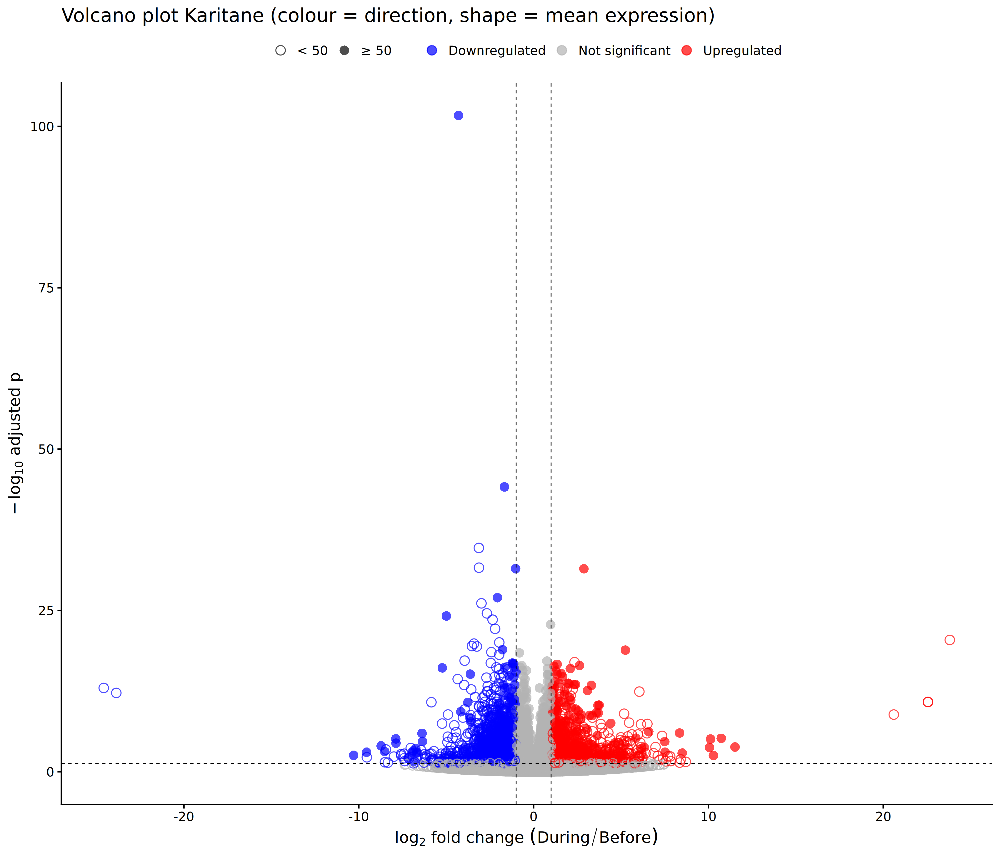

In [75]:
options(repr.plot.width = 14, repr.plot.height = 12, repr.plot.res = 300)


padj_thr <- 0.05
lfc_thr  <- 1

vdf_ka <- as.data.frame(res_ka)
vdf_ka$neglog10padj <- -log10(vdf_ka$padj)

# classify direction (up / down / not sig)
vdf_ka$direction <- with(
  vdf_ka,
  ifelse(
    !is.na(padj) & padj < padj_thr & log2FoldChange >=  lfc_thr, "Upregulated",
    ifelse(!is.na(padj) & padj < padj_thr & log2FoldChange <= -lfc_thr, "Downregulated", "Not significant")
  )
)

# shape by mean expression (using baseMean)
vdf_ka$expr_group <- ifelse(vdf_ka$baseMean < 50, "< 50", "≥ 50")



p = ggplot(vdf_ka, aes(x = log2FoldChange, y = neglog10padj)) +
  geom_point(
    aes(colour = direction, shape = expr_group),
    size  = 4,
    alpha = 0.7
  ) +
  scale_color_manual(
    values = c(
      "Upregulated"     = "red",
      "Downregulated"   = "blue",
      "Not significant" = "grey70"
    )
  ) +
  scale_shape_manual(
    values = c(
      "< 50" = 1,  # triangle
      "≥ 50" = 16   # filled circle
    )
  ) +
  geom_vline(xintercept = c(-lfc_thr, lfc_thr),
             linetype = 2, linewidth = 0.4) +
  geom_hline(yintercept = -log10(padj_thr),
             linetype = 2, linewidth = 0.4) +
  labs(
    x = expression(log[2]~fold~change~(During/Before)),
    y = expression(-log[10]~adjusted~p),
    title = "Volcano plot Karitane (colour = direction, shape = mean expression)"
  ) +
  theme_classic(base_size = 16) +
  theme(
    legend.position = "top",
    legend.title = element_blank()
  )

p

Warning message in scan(file = file, what = what, sep = sep, quote = quote, dec = dec, :
“EOF within quoted string”
Warning message in scan(file = file, what = what, sep = sep, quote = quote, dec = dec, :
“number of items read is not a multiple of the number of columns”
Warning message:
“Removed 151 rows containing missing values or values outside the scale range (`geom_point()`).”


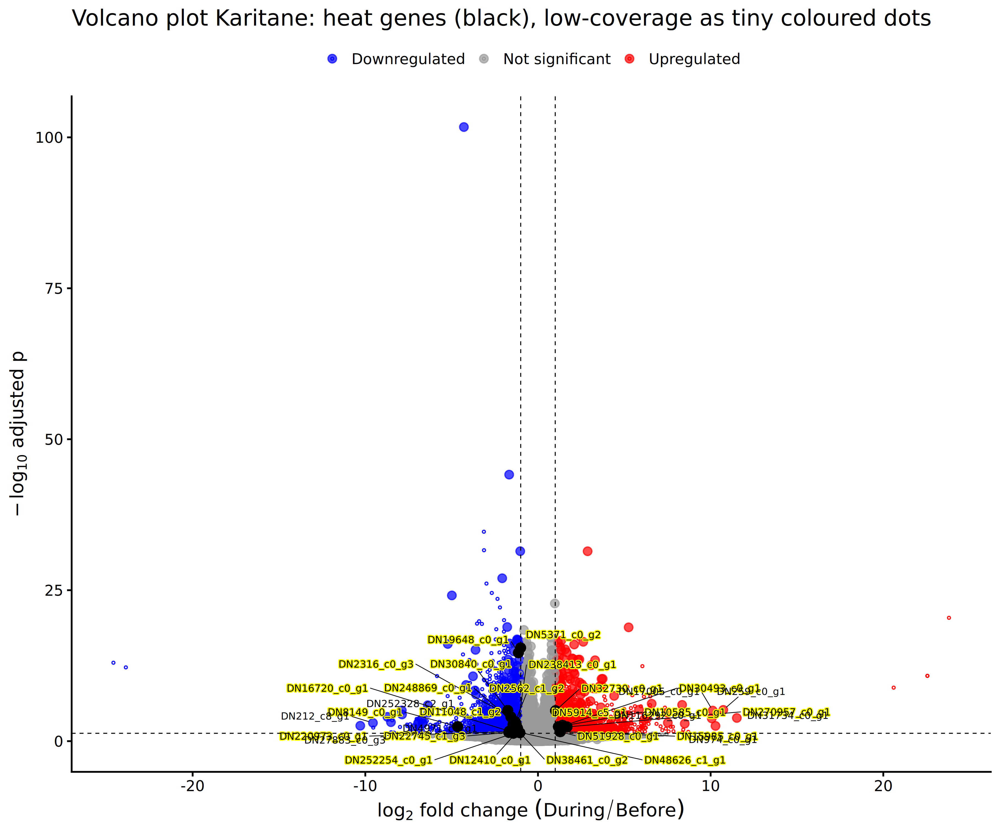

In [77]:
library(ggplot2)
library(ggrepel)

options(repr.plot.width = 12, repr.plot.height = 10, repr.plot.res = 300)

padj_thr <- 0.05
lfc_thr  <- 1

# Base DF
vdf_ka <- as.data.frame(res_ka)
vdf_ka$gene <- rownames(vdf_ka)
vdf_ka$neglog10padj <- -log10(vdf_ka$padj)

# Load heat genes
heat_genes <- read.table("by_heat_only.tsv", sep = "\t", header = FALSE)$V1
heat_genes <- unique(trimws(gsub("'", "", heat_genes)))

# Significant?
is_sig <- !is.na(vdf_ka$padj) &
          vdf_ka$padj < padj_thr &
          abs(vdf_ka$log2FoldChange) >= lfc_thr

# Significant heat genes
heat_sig_genes <- vdf_ka$gene[is_sig & vdf_ka$gene %in% heat_genes]

# Top 10 sig up/down
sig_df <- vdf_ka[is_sig, , drop = FALSE]
top10_pos <- head(sig_df[order(sig_df$log2FoldChange, decreasing = TRUE), "gene"], 10)
top10_neg <- head(sig_df[order(sig_df$log2FoldChange, decreasing = FALSE), "gene"], 10)

# Labels
vdf_ka$label_heat  <- ifelse(vdf_ka$gene %in% heat_sig_genes, vdf_ka$gene, NA)
vdf_ka$label_top10 <- ifelse(
  vdf_ka$gene %in% c(top10_pos, top10_neg) & vdf_ka$baseMean >= 50,
  vdf_ka$gene, NA
)

vdf_ka$label_heat  <- sub("^TRINITY_", "", vdf_ka$label_heat)
vdf_ka$label_top10 <- sub("^TRINITY_", "", vdf_ka$label_top10)

# Direction group
vdf_ka$direction <- with(
  vdf_ka,
  ifelse(!is.na(padj) & padj < padj_thr & log2FoldChange >=  lfc_thr, "Upregulated",
  ifelse(!is.na(padj) & padj < padj_thr & log2FoldChange <= -lfc_thr, "Downregulated",
         "Not significant"))
)

# Split for clean layering
df_low  <- subset(vdf_ka, baseMean < 50)
df_high <- subset(vdf_ka, baseMean >= 50)

p <- ggplot() +

  # -----------------------------------
  # 1. High coverage points (big dots)
  # -----------------------------------
  geom_point(
    data = df_high,
    aes(x = log2FoldChange, y = neglog10padj, colour = direction),
    size = 3,
    alpha = 0.7
  ) +

  # -----------------------------------
  # 2. Low coverage points (tiny dots, coloured)
  # -----------------------------------
  geom_point(
    data = df_low,
    aes(x = log2FoldChange, y = neglog10padj, colour = direction),
    size = 0.7,
    alpha = 0.9, shape=1
  ) +

  # -----------------------------------
  # 3. Heat genes (big black points)
  # -----------------------------------
  geom_point(
    data = subset(vdf_ka, gene %in% heat_sig_genes),
    aes(x = log2FoldChange, y = neglog10padj),
    size   = 4,
    colour = "black",
    shape  = 16
  ) +

  # -----------------------------------
  # 4. Labels
  # -----------------------------------
  geom_text_repel(
    data = subset(vdf_ka, !is.na(label_heat)),
    aes(x = log2FoldChange, y = neglog10padj, label = label_heat),
    size = 3,
    box.padding = 0.5,
    point.padding = 0.4,
    max.overlaps = Inf,
    segment.size = 0.3,
    colour = "black",  bg.color = "yellow",
    bg.r = 0.15
  ) +

  geom_text_repel(
    data = subset(vdf_ka, !is.na(label_top10)),
    aes(x = log2FoldChange, y = neglog10padj, label = label_top10),
    size = 3,
    box.padding = 0.5,
    point.padding = 0.4,
    max.overlaps = Inf,
    segment.size = 0.3
  ) +

  # -----------------------------------
  # Colours, theme, axes
  # -----------------------------------
  scale_color_manual(
    values = c(
      "Upregulated"     = "red",
      "Downregulated"   = "blue",
      "Not significant" = "grey60"
    )
  ) +

  geom_vline(xintercept = c(-lfc_thr, lfc_thr), linetype = 2, linewidth = 0.4) +
  geom_hline(yintercept = -log10(padj_thr),     linetype = 2, linewidth = 0.4) +

  labs(
    x = expression(log[2]~fold~change~(During/Before)),
    y = expression(-log[10]~adjusted~p),
    title = "Volcano plot Karitane: heat genes (black), low-coverage as tiny coloured dots"
  ) +
  theme_classic(base_size = 16) +
  theme(
    legend.position = "top",
    legend.title = element_blank()
  )

p


In [78]:
ggsave("karitane_volcano_labeled.png", plot = p, width = 14, height = 10, dpi = 300)


Warning message:
“Removed 151 rows containing missing values or values outside the scale range (`geom_point()`).”


In [53]:
# --- Haast subset: clean DE fit for volcano ---

# Subset
dds_ha <- dds[, dds$Location == "Haast"]

# Drop unused levels
dds_ha$Location <- droplevels(dds_ha$Location)
dds_ha$before_during_heatwave <- droplevels(dds_ha$before_during_heatwave)

# Ensure both levels exist
tbl_ha <- table(dds_ha$before_during_heatwave)
if (length(tbl_ha) < 2) {
  stop("Haast subset has only one level of 'before_during_heatwave': ", paste(names(tbl_ha), collapse = ", "))
}

# Set reference and design ONCE, then fit
dds_ha$before_during_heatwave <- relevel(dds_ha$before_during_heatwave, ref = "Before")
design(dds_ha) <- ~ before_during_heatwave
dds_ha <- DESeq(dds_ha)

# Results (During vs Before)
res_ha <- results(dds_ha, contrast = c("before_during_heatwave", "During", "Before"))

# (Optional) VST
# vsd_ha <- vst(dds_ha, blind = TRUE)


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

-- replacing outliers and refitting for 3879 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



In [54]:
# Bigger inline figures in Jupyter (IRkernel)
options(repr.plot.width = 16,  # inches
        repr.plot.height = 9,
        repr.plot.res = 200)   # DPI for inline display


using ntop=500 top features by variance



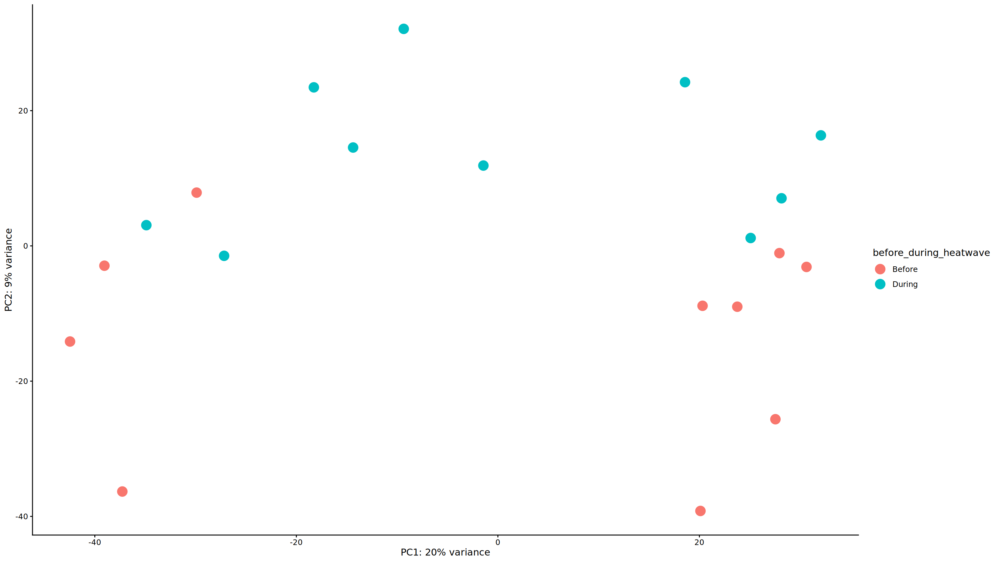

In [55]:

## 2) VST on the subset
vsd_ha <- vst(dds_ha, blind = TRUE)

## 3) PCA (color by Date)
pcaData_ha <- plotPCA(vsd_ha, intgroup = "before_during_heatwave", returnData = TRUE)
percentVar <- round(100 * attr(pcaData_ha, "percentVar"))

ggplot(pcaData_ha, aes(PC1, PC2, color = before_during_heatwave)) +
  geom_point(size = 5) +
  xlab(paste0("PC1: ", percentVar[1], "% variance")) +
  ylab(paste0("PC2: ", percentVar[2], "% variance")) +
  theme_classic()

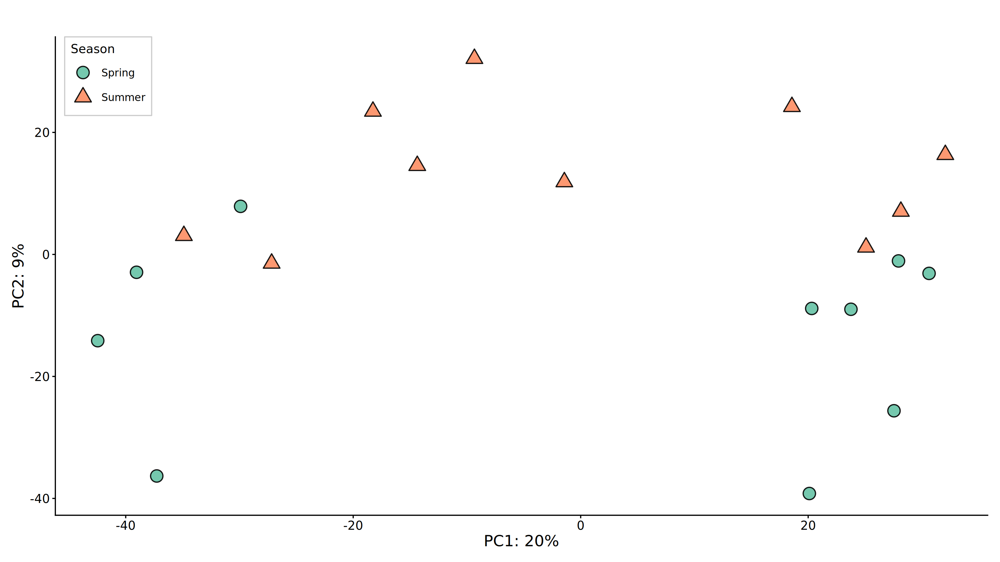

In [56]:
library(ggplot2)

# Relabel seasons for Akaroa subset
pcaData_ha$Season <- ifelse(pcaData_ha$before_during_heatwave == "Before",
                            "Spring", "Summer")

ggplot(pcaData_ha, aes(PC1, PC2)) +
  geom_point(aes(fill = Season, shape = Season),
             colour = "black",
             size = 6,
             stroke = 1,
             alpha = 0.9,
             na.rm = TRUE) +
  labs(
    x = paste0("PC1: ", percentVar[1], "%"),
    y = paste0("PC2: ", percentVar[2], "%"),
    fill  = "Season",
    shape = "Season"
  ) +
  scale_shape_manual(values = c(Spring = 21, Summer = 24)) +
  scale_fill_brewer(palette = "Set2") +
  theme_classic(base_size = 14) +
  theme(
    axis.title = element_text(size = 18),
    axis.text  = element_text(size = 14),
    plot.title = element_blank(),
    plot.margin = grid::unit(c(1.5, 0.5, 0.5, 0.5), "cm"),
    legend.position = c(0.01, 1),
    legend.justification = c("left", "top"),
    legend.background = element_rect(fill = "white", colour = "grey80"),
    legend.title = element_text(size = 14),
    legend.text  = element_text(size = 12),
    legend.key.size = grid::unit(10, "mm")
  ) +
  guides(
    fill = guide_legend(
      override.aes = list(shape = c(21, 24),
                          colour = "black",
                          size = 6)
    ),
    shape = "none"   # hides duplicate legend
  )


In [57]:
# Save as PNG (high resolution)
ggsave(
  filename = "PCA_ha_vst.png",
  width = 18,    # inches
  height = 9,
  dpi = 300,
  units = "in"
)

# Save as SVG (for vector figure editing)
ggsave(
  filename = "PCA_ha_vst.svg",
  width = 18,
  height = 9,
  units = "in"
)


Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Sample distance heatmap (VST) — Haast' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Sample distance heatmap (VST) — Haast' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Sample distance heatmap (VST) — Haast' in 'mbcsToSbcs': dot substituted for <94>”


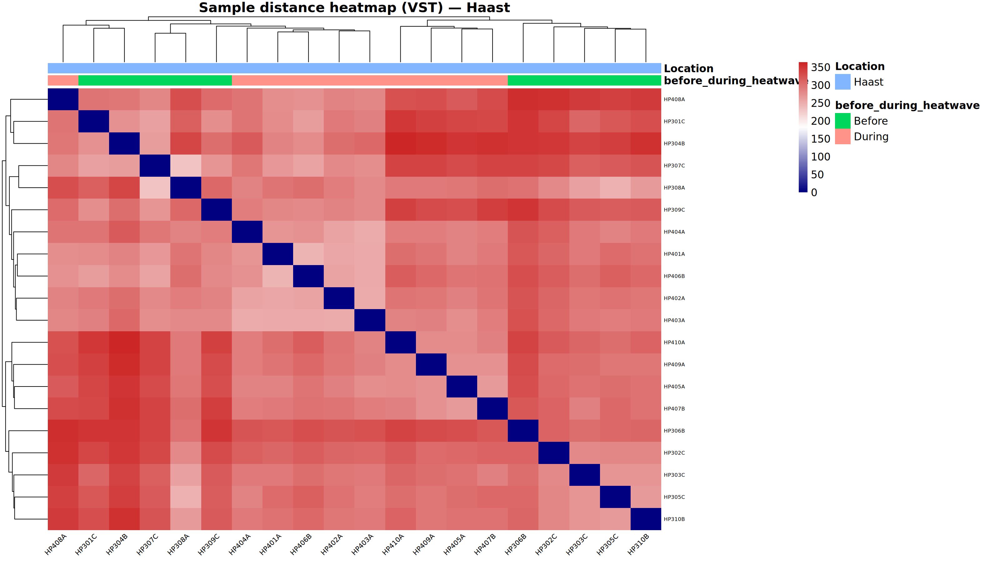

In [58]:
# 1) Distance on VST expression (samples = columns)
vsd_mat_ha <- assay(vsd_ha)
d_ha <- dist(t(vsd_mat_ha))         # Euclidean distance between samples
dmat_ha <- as.matrix(d_ha)

# 2) Optional annotation for heatmap side bars
ann_ha <- as.data.frame(colData(vsd_ha)[, 
  intersect(c("before_during_heatwave","Location"), names(colData(vsd_ha))), drop = FALSE])

# 3) Plot (uses pheatmap if available; else base heatmap)
pal <- colorRampPalette(c("navy", "white", "firebrick3"))

if (requireNamespace("pheatmap", quietly = TRUE)) {
  pheatmap::pheatmap(
    dmat_ha,
    clustering_distance_rows = d_ha,
    clustering_distance_cols = d_ha,
    color = pal(150),
    annotation_col = if (ncol(ann_ha)) ann_ha else NULL,
    main = "Sample distance heatmap (VST) — Haast",
    fontsize = 12,
    fontsize_row = 6,
    fontsize_col = 8,
    border_color = NA,
    angle_col = 45        # tilt column labels if many samples
  )
} else {
  heatmap(dmat_ha, symm = TRUE, col = pal(150), main = "Sample distance heatmap (VST) — Haast")
}

Warning message:
“Removed 4008 rows containing missing values or values outside the scale range (`geom_point()`).”


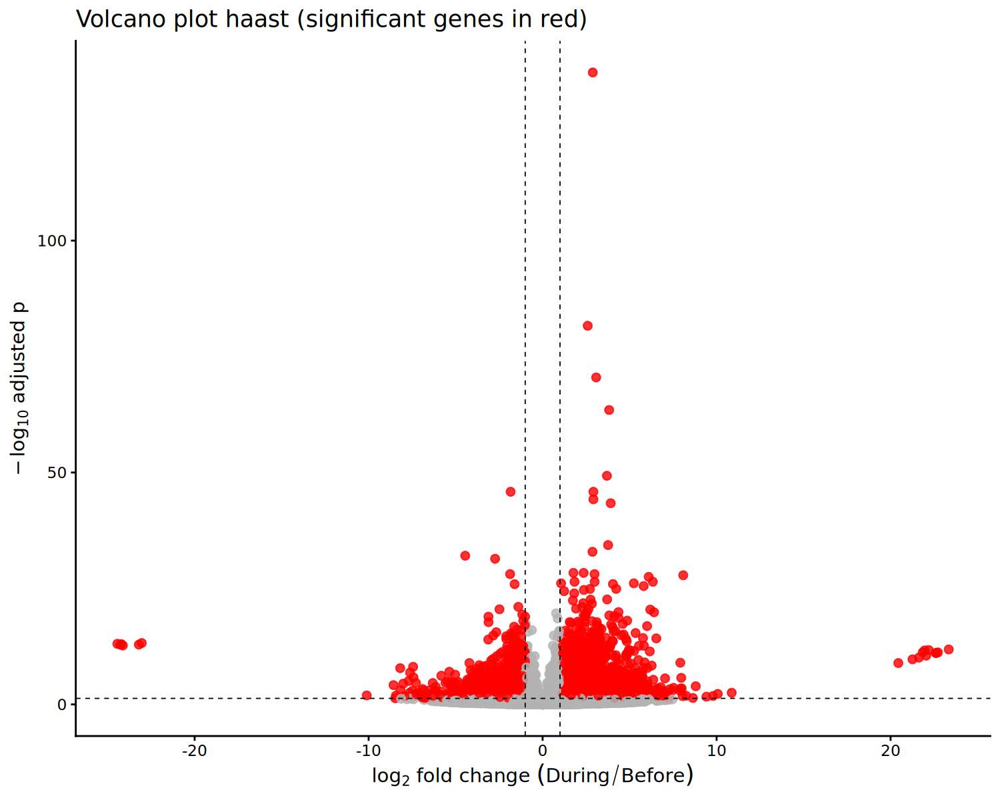

In [59]:
# Use results already computed from DESeq2
res_ha <- results(dds_ha, contrast = c("before_during_heatwave", "During", "Before"))

# Prep data frame
vdf_ha <- as.data.frame(res_ha)
vdf_ha$neglog10padj <- -log10(vdf_ha$padj)

# thresholds
padj_thr <- 0.05
lfc_thr  <- 1

# significance flag
vdf_ha$sig <- with(vdf_ha,
  ifelse(!is.na(padj) & padj < padj_thr & abs(log2FoldChange) >= lfc_thr, "sig", "ns")
)

# bigger plots in Jupyter
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 150)

# basic volcano
ggplot(vdf_ha, aes(x = log2FoldChange, y = neglog10padj)) +
  geom_point(aes(color = sig), size = 2.5, alpha = 0.8) +
  scale_color_manual(values = c("ns" = "grey70", "sig" = "red")) +
  geom_vline(xintercept = c(-lfc_thr, lfc_thr), linetype = 2, linewidth = 0.4) +
  geom_hline(yintercept = -log10(padj_thr), linetype = 2, linewidth = 0.4) +
  labs(
    x = expression(log[2]~fold~change~(During/Before)),
    y = expression(-log[10]~adjusted~p),
    title = "Volcano plot haast (significant genes in red)"
  ) +
  theme_classic(base_size = 14) +
  theme(legend.position = "none")

In [60]:
# Bigger inline figures in Jupyter (IRkernel)
options(repr.plot.width = 20,  # inches
        repr.plot.height = 9,
        repr.plot.res = 300)   # DPI for inline display


In [61]:
options(repr.plot.width = 20, repr.plot.height = 16, repr.plot.res = 600)


padj_thr <- 0.05
lfc_thr  <- 1

vdf_ha <- as.data.frame(res_ha)
vdf_ha$neglog10padj <- -log10(vdf_ha$padj)

# classify direction (up / down / not sig)
vdf_ha$direction <- with(
  vdf_ha,
  ifelse(
    !is.na(padj) & padj < padj_thr & log2FoldChange >=  lfc_thr, "Upregulated",
    ifelse(!is.na(padj) & padj < padj_thr & log2FoldChange <= -lfc_thr, "Downregulated", "Not significant")
  )
)

# shape by mean expression (using baseMean)
vdf_ha$expr_group <- ifelse(vdf_ha$baseMean < 50, "< 50", "≥ 50")



p = ggplot(vdf_ha, aes(x = log2FoldChange, y = neglog10padj)) +
  geom_point(
    aes(colour = direction, shape = expr_group),
    size  = 4,
    alpha = 0.7
  ) +
  scale_color_manual(
    values = c(
      "Upregulated"     = "red",
      "Downregulated"   = "blue",
      "Not significant" = "grey70"
    )
  ) +
  scale_shape_manual(
    values = c(
      "< 50" = 1,  # triangle
      "≥ 50" = 16   # filled circle
    )
  ) +
  geom_vline(xintercept = c(-lfc_thr, lfc_thr),
             linetype = 2, linewidth = 0.4) +
  geom_hline(yintercept = -log10(padj_thr),
             linetype = 2, linewidth = 0.4) +
  labs(
    x = expression(log[2]~fold~change~(During/Before)),
    y = expression(-log[10]~adjusted~p),
    title = "Volcano plot Haast (colour = direction, shape = mean expression)"
  ) +
  theme_classic(base_size = 16) +
  theme(
    legend.position = "top",
    legend.title = element_blank()
  )


In [62]:
ggsave("haast_volcano_large.png", plot = p, width = 14, height = 10, dpi = 300)


Warning message:
“Removed 4008 rows containing missing values or values outside the scale range (`geom_point()`).”


Warning message in scan(file = file, what = what, sep = sep, quote = quote, dec = dec, :
“EOF within quoted string”
Warning message in scan(file = file, what = what, sep = sep, quote = quote, dec = dec, :
“number of items read is not a multiple of the number of columns”
Warning message:
“Removed 4008 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 100308 rows containing missing values or values outside the scale range (`geom_text_repel()`).”
Warning message:
“Removed 100321 rows containing missing values or values outside the scale range (`geom_text_repel()`).”


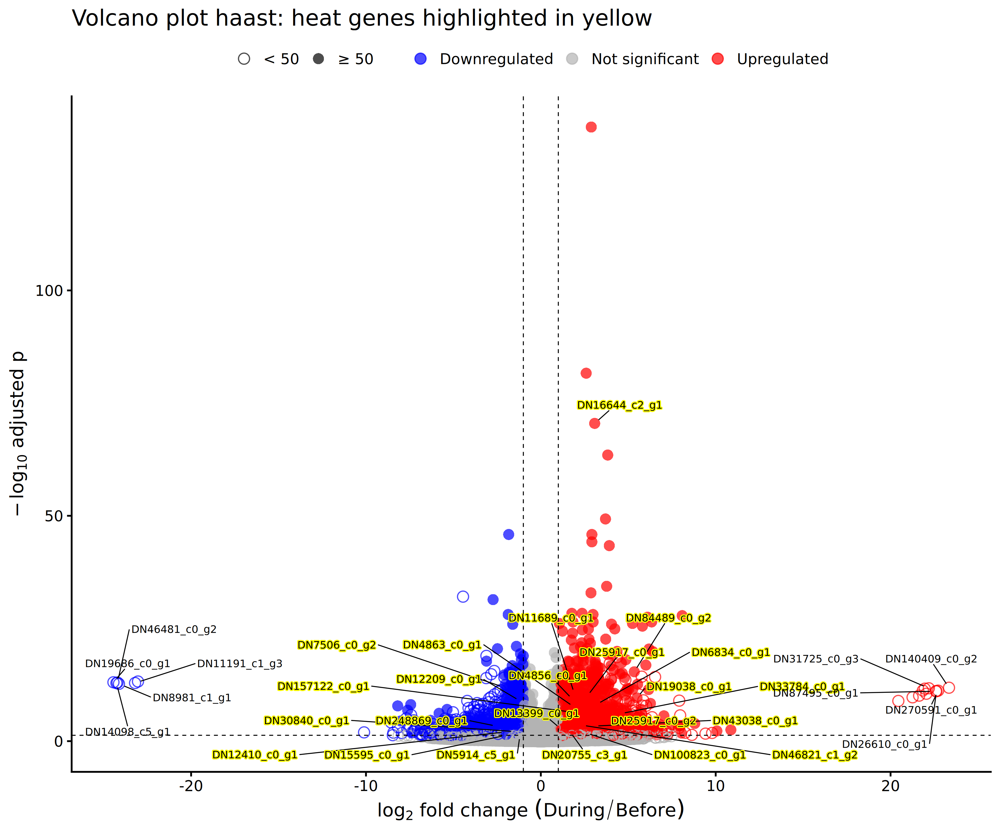

In [64]:
library(ggplot2)
library(ggrepel)

options(repr.plot.width = 12, repr.plot.height = 10, repr.plot.res = 300)

padj_thr <- 0.05
lfc_thr  <- 1

# Base DF
vdf_ha <- as.data.frame(res_ha)
vdf_ha$gene <- rownames(vdf_ha)
vdf_ha$neglog10padj <- -log10(vdf_ha$padj)

# Load & clean heat genes
heat_genes <- read.table("by_heat_only.tsv", sep = "\t", header = FALSE)$V1
heat_genes <- unique(trimws(gsub("'", "", heat_genes)))

# Which genes are significant?
is_sig <- !is.na(vdf_ha$padj) &
          vdf_ha$padj < padj_thr &
          abs(vdf_ha$log2FoldChange) >= lfc_thr

# 1) significant heat genes
heat_sig_genes <- vdf_ha$gene[is_sig & vdf_ha$gene %in% heat_genes]

# 2) top 10 positive and negative fold change (significant only)
sig_df <- vdf_ha[is_sig, , drop = FALSE]
top10_pos <- head(sig_df[order(sig_df$log2FoldChange, decreasing = TRUE), "gene"], 5)
top10_neg <- head(sig_df[order(sig_df$log2FoldChange, decreasing = FALSE), "gene"], 5)

# Two separate label columns
vdf_ha$label_heat  <- ifelse(vdf_ha$gene %in% heat_sig_genes, vdf_ha$gene, NA)
vdf_ha$label_top10 <- ifelse(vdf_ha$gene %in% c(top10_pos, top10_neg), vdf_ha$gene, NA)

# ---- REMOVE TRINITY_ PREFIX ----
vdf_ha$label_heat  <- sub("^TRINITY_", "", vdf_ha$label_heat)
vdf_ha$label_top10 <- sub("^TRINITY_", "", vdf_ha$label_top10)


# Volcano classification
vdf_ha$direction <- with(
  vdf_ha,
  ifelse(!is.na(padj) & padj < padj_thr & log2FoldChange >=  lfc_thr, "Upregulated",
  ifelse(!is.na(padj) & padj < padj_thr & log2FoldChange <= -lfc_thr, "Downregulated",
         "Not significant"))
)

vdf_ha$expr_group <- ifelse(vdf_ha$baseMean < 50, "< 50", "≥ 50")

p <- ggplot(vdf_ha, aes(x = log2FoldChange, y = neglog10padj)) +
  geom_point(
    aes(colour = direction, shape = expr_group),
    size  = 4,
    alpha = 0.7
  ) +

  # ---- HEAT GENES: yellow highlight ----
  geom_text_repel(
    aes(label = label_heat),
    size = 3.2,
    box.padding = 0.8,
    point.padding = 0.6,
    min.segment.length = 0,
    max.overlaps = Inf,
    segment.color = "black",
    segment.size  = 0.4,
    bg.color = "yellow",
    bg.r = 0.15
  ) +

  # ---- TOP 10 UP/DOWN GENES: normal labels ----
  geom_text_repel(
    aes(label = label_top10),
    size = 3.2,
    box.padding = 0.8,
    point.padding = 0.6,
    min.segment.length = 0,
    max.overlaps = Inf,
    segment.color = "black",
    segment.size  = 0.4
  ) +

  scale_color_manual(
    values = c(
      "Upregulated"     = "red",
      "Downregulated"   = "blue",
      "Not significant" = "grey70"
    )
  ) +
  scale_shape_manual(values = c("< 50" = 1, "≥ 50" = 16)) +

  geom_vline(xintercept = c(-lfc_thr, lfc_thr), linetype = 2, linewidth = 0.4) +
  geom_hline(yintercept = -log10(padj_thr),   linetype = 2, linewidth = 0.4) +

  labs(
    x = expression(log[2]~fold~change~(During/Before)),
    y = expression(-log[10]~adjusted~p),
    title = "Volcano plot haast: heat genes highlighted in yellow"
  ) +
  theme_classic(base_size = 16) +
  theme(
    legend.position = "top",
    legend.title = element_blank()
  )

p


Warning message in scan(file = file, what = what, sep = sep, quote = quote, dec = dec, :
“EOF within quoted string”
Warning message in scan(file = file, what = what, sep = sep, quote = quote, dec = dec, :
“number of items read is not a multiple of the number of columns”
Warning message:
“Removed 4008 rows containing missing values or values outside the scale range (`geom_point()`).”


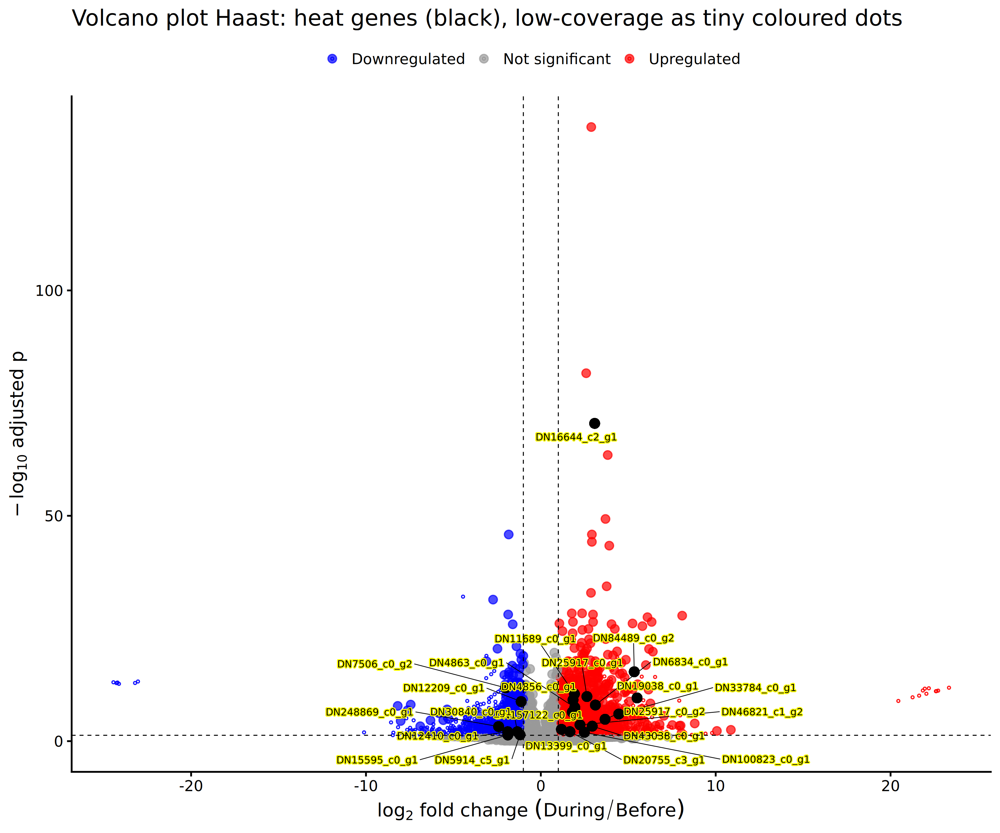

In [72]:
library(ggplot2)
library(ggrepel)

options(repr.plot.width = 12, repr.plot.height = 10, repr.plot.res = 300)

padj_thr <- 0.05
lfc_thr  <- 1

# Base DF
vdf_ha <- as.data.frame(res_ha)
vdf_ha$gene <- rownames(vdf_ha)
vdf_ha$neglog10padj <- -log10(vdf_ha$padj)

# Load heat genes
heat_genes <- read.table("by_heat_only.tsv", sep = "\t", header = FALSE)$V1
heat_genes <- unique(trimws(gsub("'", "", heat_genes)))

# Significant?
is_sig <- !is.na(vdf_ha$padj) &
          vdf_ha$padj < padj_thr &
          abs(vdf_ha$log2FoldChange) >= lfc_thr

# Significant heat genes
heat_sig_genes <- vdf_ha$gene[is_sig & vdf_ha$gene %in% heat_genes]

# Top 10 sig up/down
sig_df <- vdf_ha[is_sig, , drop = FALSE]
top10_pos <- head(sig_df[order(sig_df$log2FoldChange, decreasing = TRUE), "gene"], 10)
top10_neg <- head(sig_df[order(sig_df$log2FoldChange, decreasing = FALSE), "gene"], 10)

# Labels
vdf_ha$label_heat  <- ifelse(vdf_ha$gene %in% heat_sig_genes, vdf_ha$gene, NA)
vdf_ha$label_top10 <- ifelse(
  vdf_ha$gene %in% c(top10_pos, top10_neg) & vdf_ha$baseMean >= 50,
  vdf_ha$gene, NA
)

vdf_ha$label_heat  <- sub("^TRINITY_", "", vdf_ha$label_heat)
vdf_ha$label_top10 <- sub("^TRINITY_", "", vdf_ha$label_top10)

# Direction group
vdf_ha$direction <- with(
  vdf_ha,
  ifelse(!is.na(padj) & padj < padj_thr & log2FoldChange >=  lfc_thr, "Upregulated",
  ifelse(!is.na(padj) & padj < padj_thr & log2FoldChange <= -lfc_thr, "Downregulated",
         "Not significant"))
)

# Split for clean layering
df_low  <- subset(vdf_ha, baseMean < 50)
df_high <- subset(vdf_ha, baseMean >= 50)

p <- ggplot() +

  # -----------------------------------
  # 1. High coverage points (big dots)
  # -----------------------------------
  geom_point(
    data = df_high,
    aes(x = log2FoldChange, y = neglog10padj, colour = direction),
    size = 3,
    alpha = 0.7
  ) +

  # -----------------------------------
  # 2. Low coverage points (tiny dots, coloured)
  # -----------------------------------
  geom_point(
    data = df_low,
    aes(x = log2FoldChange, y = neglog10padj, colour = direction),
    size = 0.7,
    alpha = 0.9, shape=1
  ) +

  # -----------------------------------
  # 3. Heat genes (big black points)
  # -----------------------------------
  geom_point(
    data = subset(vdf_ha, gene %in% heat_sig_genes),
    aes(x = log2FoldChange, y = neglog10padj),
    size   = 4,
    colour = "black",
    shape  = 16
  ) +

  # -----------------------------------
  # 4. Labels
  # -----------------------------------
  geom_text_repel(
    data = subset(vdf_ha, !is.na(label_heat)),
    aes(x = log2FoldChange, y = neglog10padj, label = label_heat),
    size = 3,
    box.padding = 0.5,
    point.padding = 0.4,
    max.overlaps = Inf,
    segment.size = 0.3,
    colour = "black",  bg.color = "yellow",
    bg.r = 0.15
  ) +

  geom_text_repel(
    data = subset(vdf_ha, !is.na(label_top10)),
    aes(x = log2FoldChange, y = neglog10padj, label = label_top10),
    size = 3,
    box.padding = 0.5,
    point.padding = 0.4,
    max.overlaps = Inf,
    segment.size = 0.3
  ) +

  # -----------------------------------
  # Colours, theme, axes
  # -----------------------------------
  scale_color_manual(
    values = c(
      "Upregulated"     = "red",
      "Downregulated"   = "blue",
      "Not significant" = "grey60"
    )
  ) +

  geom_vline(xintercept = c(-lfc_thr, lfc_thr), linetype = 2, linewidth = 0.4) +
  geom_hline(yintercept = -log10(padj_thr),     linetype = 2, linewidth = 0.4) +

  labs(
    x = expression(log[2]~fold~change~(During/Before)),
    y = expression(-log[10]~adjusted~p),
    title = "Volcano plot Haast: heat genes (black), low-coverage as tiny coloured dots"
  ) +
  theme_classic(base_size = 16) +
  theme(
    legend.position = "top",
    legend.title = element_blank()
  )

p


In [73]:
ggsave("haast_volcano_labeled.png", plot = p, width = 14, height = 10, dpi = 300)

Warning message:
“Removed 4008 rows containing missing values or values outside the scale range (`geom_point()`).”


In [50]:
# --- helper: extract sig genes by direction from a DESeq2 results data.frame ---
get_sig_genes <- function(vdf, direction = c("up","down"), padj_thr = 0.05, lfc_thr = 1) {
  direction <- match.arg(direction)
  stopifnot(is.data.frame(vdf), all(c("padj","log2FoldChange") %in% names(vdf)))
  if (!"gene" %in% names(vdf)) vdf$gene <- rownames(vdf)

  x <- vdf[!is.na(vdf$padj) & vdf$padj < padj_thr & abs(vdf$log2FoldChange) >= lfc_thr, , drop = FALSE]
  if (direction == "up")  x <- x[x$log2FoldChange > 0, , drop = FALSE]
  if (direction == "down") x <- x[x$log2FoldChange < 0, , drop = FALSE]
  unique(x$gene)
}

# Build sets for each site (HA, KA, AK are just short labels—rename if you want)
sets_up <- list(
  HA = get_sig_genes(vdf_ha, "up"),
  KA = get_sig_genes(vdf_ka, "up"),
  AK = get_sig_genes(vdf_ak, "up")
)

sets_down <- list(
  HA = get_sig_genes(vdf_ha, "down"),
  KA = get_sig_genes(vdf_ka, "down"),
  AK = get_sig_genes(vdf_ak, "down")
)

# Quick counts
sapply(sets_up, length)
sapply(sets_down, length)

# Save the lists (so you can reuse)
writeLines(sets_up$HA,  "sig_up_HA.txt")
writeLines(sets_up$KA,  "sig_up_KA.txt")
writeLines(sets_up$AK,  "sig_up_AK.txt")
writeLines(sets_down$HA,"sig_down_HA.txt")
writeLines(sets_down$KA,"sig_down_KA.txt")
writeLines(sets_down$AK,"sig_down_AK.txt")


HA   KA   AK 
2527 2306  370

HA   KA   AK 
2582 4929 1718

In [47]:
plot_venn3 <- function(
  sets,
  site_labels = c("Haast", "Karitane", "Akaroa"),
  title = "Up regulated genes (padj < 0.05, |log2FC| ≥ 1)",
  filename = NULL
) {
  stopifnot(length(sets) == 3)

  if (requireNamespace("VennDiagram", quietly = TRUE)) {
    fills <- c(
      Haast    = "#D95F02",  # orange
      Karitane = "#C4A7E7",  # lilac
      Akaroa   = "#1B9E77"   # green
    )

    vd <- VennDiagram::venn.diagram(
      x = sets,
      category.names = site_labels,
      filename = NULL,           # important: do not let VennDiagram write a file
      fill = fills,
      alpha = 0.6,
      col = "white",
      lwd = 2,
      cex = 1.5,
      fontface = "plain",
      cat.cex = 1.5,
      cat.fontface = "plain",
      cat.col = unname(fills),
      main = title,
      main.cex = 1.4
    )

    if (is.null(filename)) {
      # just plot to the current device
      grid::grid.newpage()
      grid::grid.draw(vd)
    } else {
      # save as SVG
      grDevices::svg(paste0(filename, ".svg"), width = 10, height = 8)
      grid::grid.draw(vd)
      grDevices::dev.off()

      # save as PNG
      grDevices::png(paste0(filename, ".png"), width = 10, height = 8,
                     units = "in", res = 300)
      grid::grid.draw(vd)
      grDevices::dev.off()
    }

  } else {
    message("Package 'VennDiagram' not installed. Showing intersection counts instead.")
    a <- sets[[1]]; b <- sets[[2]]; c <- sets[[3]]
    cat(title, "\n")
    cat("Only", site_labels[1], ":", length(setdiff(a, union(b, c))), "\n")
    cat("Only", site_labels[2], ":", length(setdiff(b, union(a, c))), "\n")
    cat("Only", site_labels[3], ":", length(setdiff(c, union(a, b))), "\n")
    cat(site_labels[1], "&", site_labels[2], ":", length(intersect(a, b)), "\n")
    cat(site_labels[1], "&", site_labels[3], ":", length(intersect(a, c)), "\n")
    cat(site_labels[2], "&", site_labels[3], ":", length(intersect(b, c)), "\n")
    cat("All three:", length(Reduce(intersect, sets)), "\n")
  }
}


agg_record_303245005 
                   2

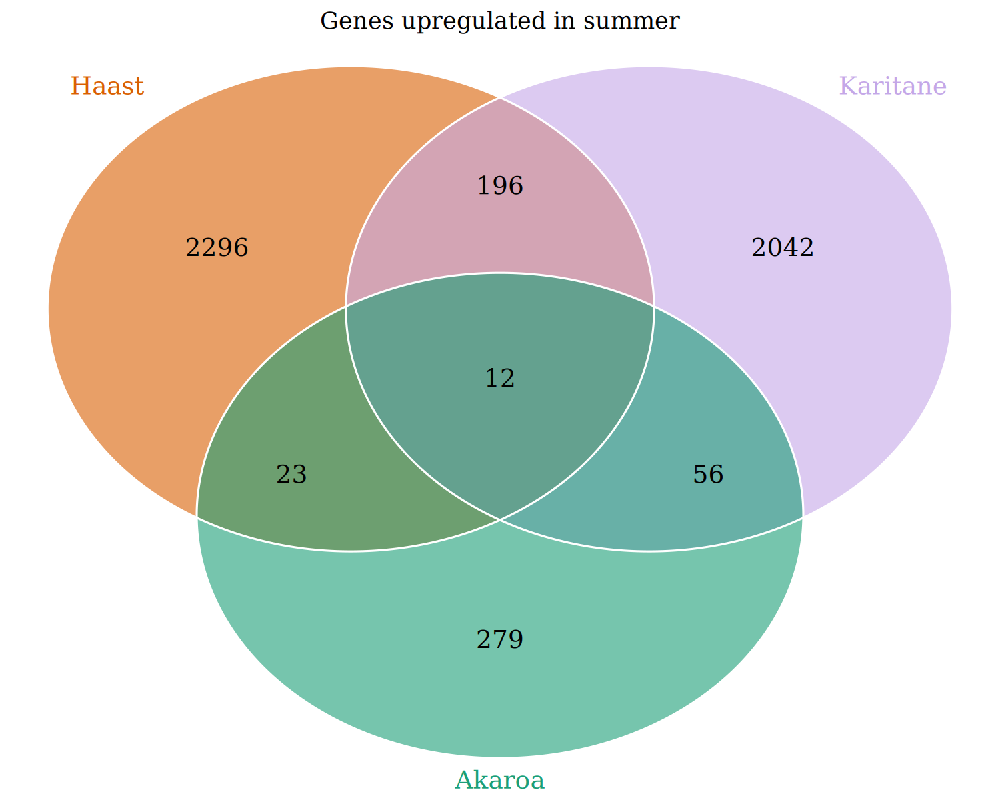

In [48]:
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 150)

# Show only
plot_venn3(
  sets_up,
  site_labels = c("Haast", "Karitane", "Akaroa"),
  title = "Genes upregulated in summer"
)

# Show + save
plot_venn3(
  sets_up,
  site_labels = c("Haast", "Karitane", "Akaroa"),
  title = "Genes upregulated in summer",
  filename = "venn_upregulated_sites"
)


agg_record_1059179618 
                    2

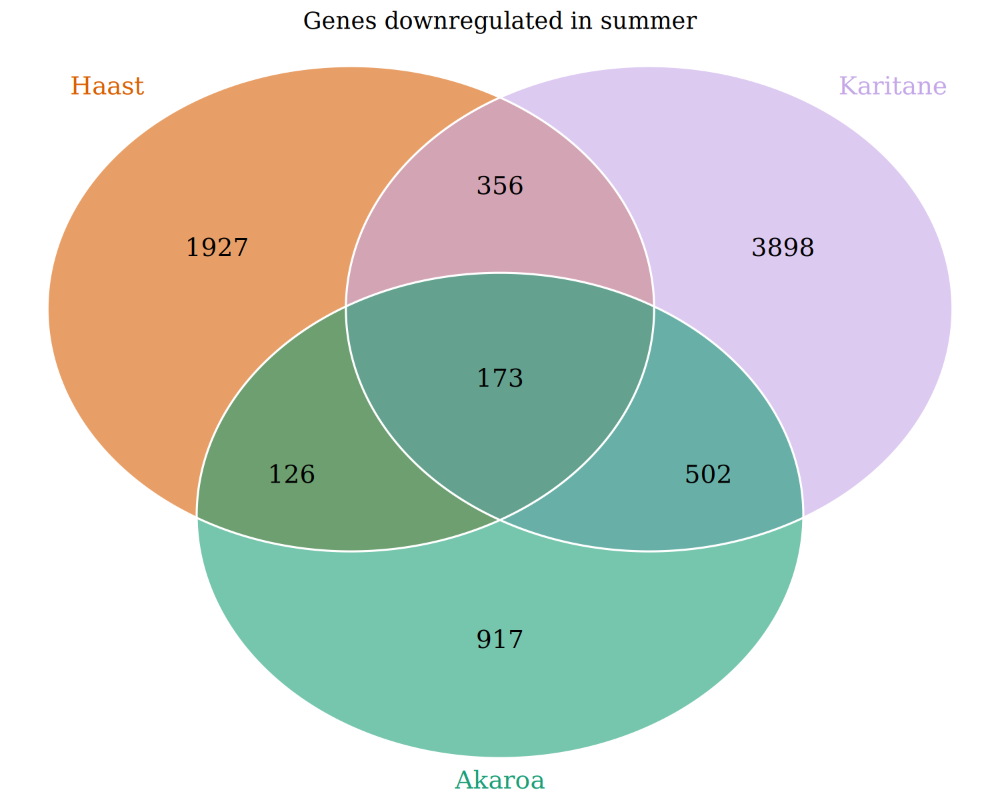

In [49]:
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 150)

# Show only
plot_venn3(
  sets_down,
  site_labels = c("Haast", "Karitane", "Akaroa"),
  title = "Genes downregulated in summer"
)

# Show + save
plot_venn3(
  sets_down,
  site_labels = c("Haast", "Karitane", "Akaroa"),
  title = "Genes downregulated in summer",
  filename = "venn_downregulated_sites"
)


In [50]:
padj_thr <- 0.05
lfc_thr  <- 1

## Haast and Karitane: heatwave in 'During'
up_ha_heat <- rownames(subset(res_ha,
                              !is.na(padj) &
                              padj < padj_thr &
                              log2FoldChange >= lfc_thr))

down_ha_heat <- rownames(subset(res_ha,
                                !is.na(padj) &
                                padj < padj_thr &
                                log2FoldChange <= -lfc_thr))

up_ka_heat <- rownames(subset(res_ka,
                              !is.na(padj) &
                              padj < padj_thr &
                              log2FoldChange >= lfc_thr))

down_ka_heat <- rownames(subset(res_ka,
                                !is.na(padj) &
                                padj < padj_thr &
                                log2FoldChange <= -lfc_thr))

## Akaroa: heatwave in 'Before'
## So heatwave-up = higher in Before = negative log2FC
up_ak_heat <- rownames(subset(res_ak,
                              !is.na(padj) &
                              padj < padj_thr &
                              log2FoldChange <= -lfc_thr))

## And heatwave-down = higher in "after heatwave" (During) = positive log2FC
down_ak_heat <- rownames(subset(res_ak,
                                !is.na(padj) &
                                padj < padj_thr &
                                log2FoldChange >= lfc_thr))


In [51]:
sets_heat_up <- list(
  Haast    = up_ha_heat,
  Karitane = up_ka_heat,
  Akaroa   = up_ak_heat
)

plot_venn3(
  sets_heat_up,
  site_labels = c("Haast", "Karitane", "Akaroa"),
  title = "Genes upregulated in heatwave conditions",
  filename = "venn_heatwave_up"
)


agg_record_671473204 
                   2

In [52]:
sets_heat_down <- list(
  Haast    = down_ha_heat,
  Karitane = down_ka_heat,
  Akaroa   = down_ak_heat
)

plot_venn3(
  sets_heat_down,
  site_labels = c("Haast", "Karitane", "Akaroa"),
  title = "Genes downregulated in heatwave conditions",
  filename = "venn_heatwave_down"
)


agg_record_1982074612 
                    2

In [53]:
# All-three overlaps
up_all3   <- Reduce(intersect, sets_up)
down_all3 <- Reduce(intersect, sets_down)
writeLines(up_all3,   "sig_up_all_three.txt")
writeLines(down_all3, "sig_down_all_three.txt")

# Pairwise overlaps (example)
up_HA_KA   <- intersect(sets_up$HA, sets_up$KA)
down_HA_KA <- intersect(sets_down$HA, sets_down$KA)
writeLines(up_HA_KA,   "sig_up_HA_KA.txt")
writeLines(down_HA_KA, "sig_down_HA_KA.txt")


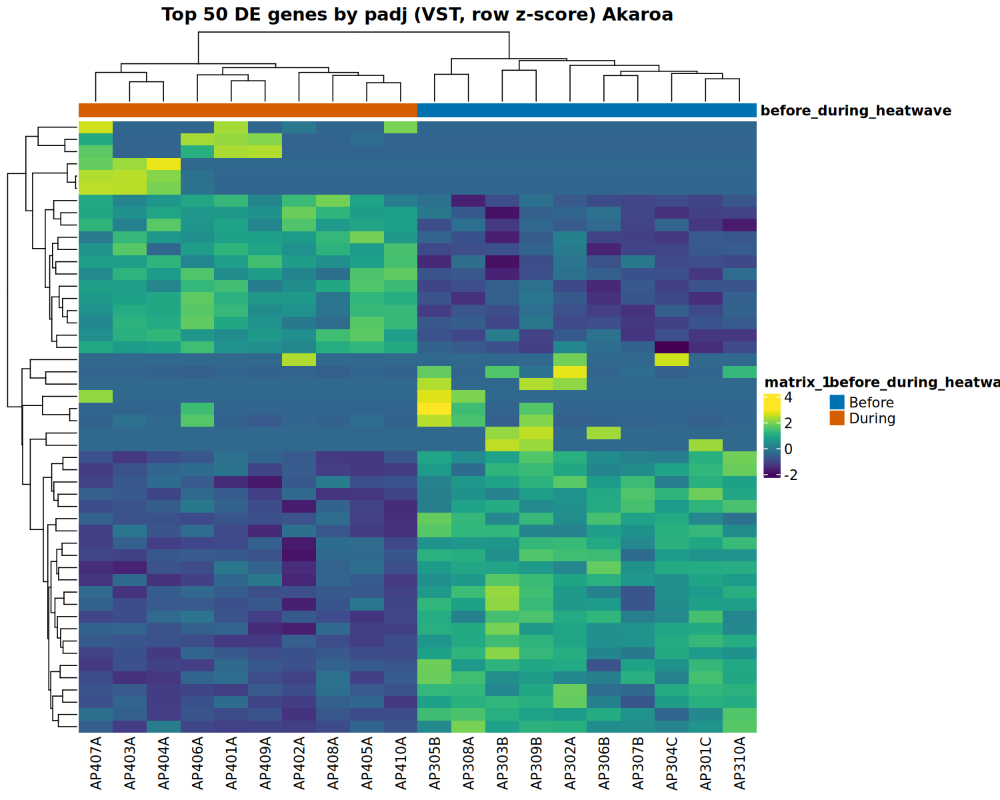

In [54]:
n <- 50

# 1) pick top-N by padj
res_df <- as.data.frame(res_ak)
res_df$gene <- rownames(res_df)

top_by_padj <- res_df %>%
  filter(!is.na(padj)) %>%
  arrange(padj) %>%
  pull(gene) %>%
  unique()

# 2) VST transform
vsd <- vst(dds_ak, blind = FALSE)

genes_in_vsd <- top_by_padj[top_by_padj %in% rownames(vsd)]
genes_sel <- head(genes_in_vsd, n)

# 3) build and scale matrix
mat <- assay(vsd)[genes_sel, , drop = FALSE]
keep <- apply(mat, 1, sd, na.rm = TRUE) > 0
mat <- mat[keep, , drop = FALSE]
mat_scaled <- t(scale(t(mat)))
mat_scaled[is.na(mat_scaled)] <- 0

# 4) sample annotations
candidate_cols <- c("before_during_heatwave", "condition", "timepoint", "group", "batch", "replicate")
have_cols <- intersect(candidate_cols, colnames(colData(vsd)))
ann_col <- if (length(have_cols) > 0) {
  ac <- as.data.frame(colData(vsd)[, have_cols, drop = FALSE])
  rownames(ac) <- colnames(mat_scaled)
  ac
} else NULL

# 5) color palettes
heat_colors <- viridis(100)  # main heatmap palette
annotation_colors <- list(
  before_during_heatwave = c(
    "Before" = "#0072B2",   # blue
    "During" = "#D55E00"    # red-orange
  )
)

# 6) plot
pheatmap(
  mat_scaled,
  color = heat_colors,
  cluster_rows = TRUE, cluster_cols = TRUE,
  show_rownames = FALSE,
  annotation_col = ann_col,
  annotation_colors = annotation_colors,
  main = sprintf("Top %d DE genes by padj (VST, row z-score) Akaroa", min(n, nrow(mat_scaled))),
  fontsize_col = 10,
  border_color = NA
)


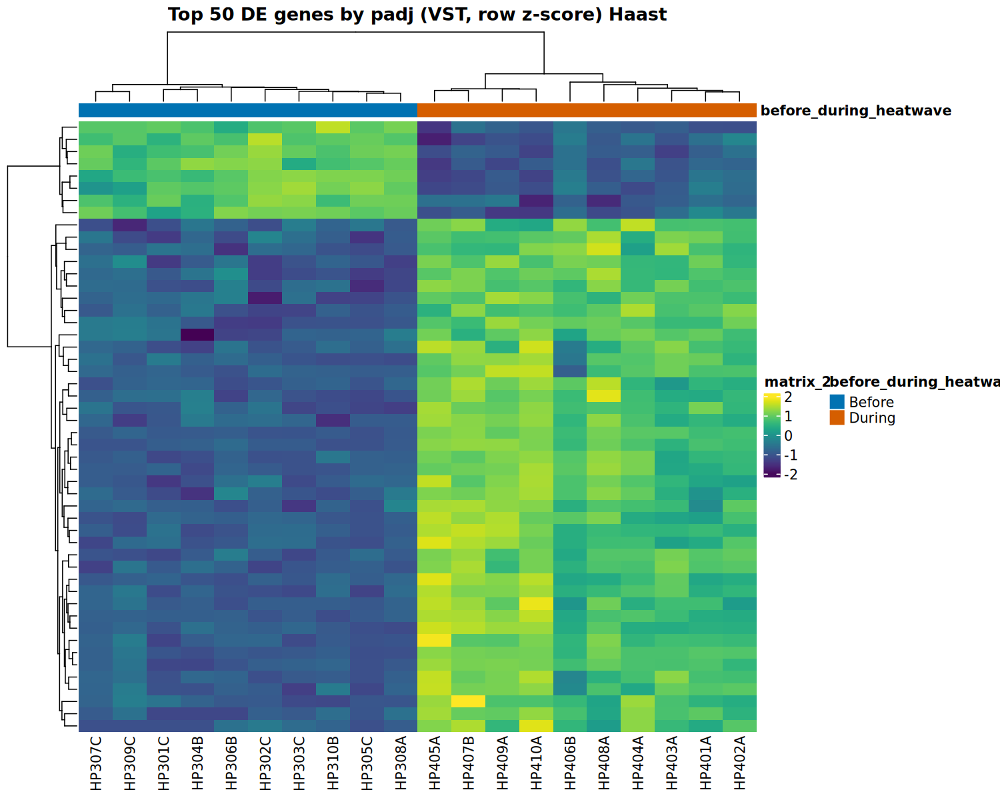

In [55]:
n <- 50

# 1) pick top-N by padj
res_df <- as.data.frame(res_ha)
res_df$gene <- rownames(res_df)

top_by_padj <- res_df %>%
  filter(!is.na(padj)) %>%
  arrange(padj) %>%
  pull(gene) %>%
  unique()

# 2) VST transform
vsd <- vst(dds_ha, blind = FALSE)

genes_in_vsd <- top_by_padj[top_by_padj %in% rownames(vsd)]
genes_sel <- head(genes_in_vsd, n)

# 3) build and scale matrix
mat <- assay(vsd)[genes_sel, , drop = FALSE]
keep <- apply(mat, 1, sd, na.rm = TRUE) > 0
mat <- mat[keep, , drop = FALSE]
mat_scaled <- t(scale(t(mat)))
mat_scaled[is.na(mat_scaled)] <- 0

# 4) sample annotations
candidate_cols <- c("before_during_heatwave", "condition", "timepoint", "group", "batch", "replicate")
have_cols <- intersect(candidate_cols, colnames(colData(vsd)))
ann_col <- if (length(have_cols) > 0) {
  ac <- as.data.frame(colData(vsd)[, have_cols, drop = FALSE])
  rownames(ac) <- colnames(mat_scaled)
  ac
} else NULL

# 5) color palettes
heat_colors <- viridis(100)  # main heatmap palette
annotation_colors <- list(
  before_during_heatwave = c(
    "Before" = "#0072B2",   # blue
    "During" = "#D55E00"    # red-orange
  )
)

# 6) plot
pheatmap(
  mat_scaled,
  color = heat_colors,
  cluster_rows = TRUE, cluster_cols = TRUE,
  show_rownames = FALSE,
  annotation_col = ann_col,
  annotation_colors = annotation_colors,
  main = sprintf("Top %d DE genes by padj (VST, row z-score) Haast", min(n, nrow(mat_scaled))),
  fontsize_col = 10,
  border_color = NA
)


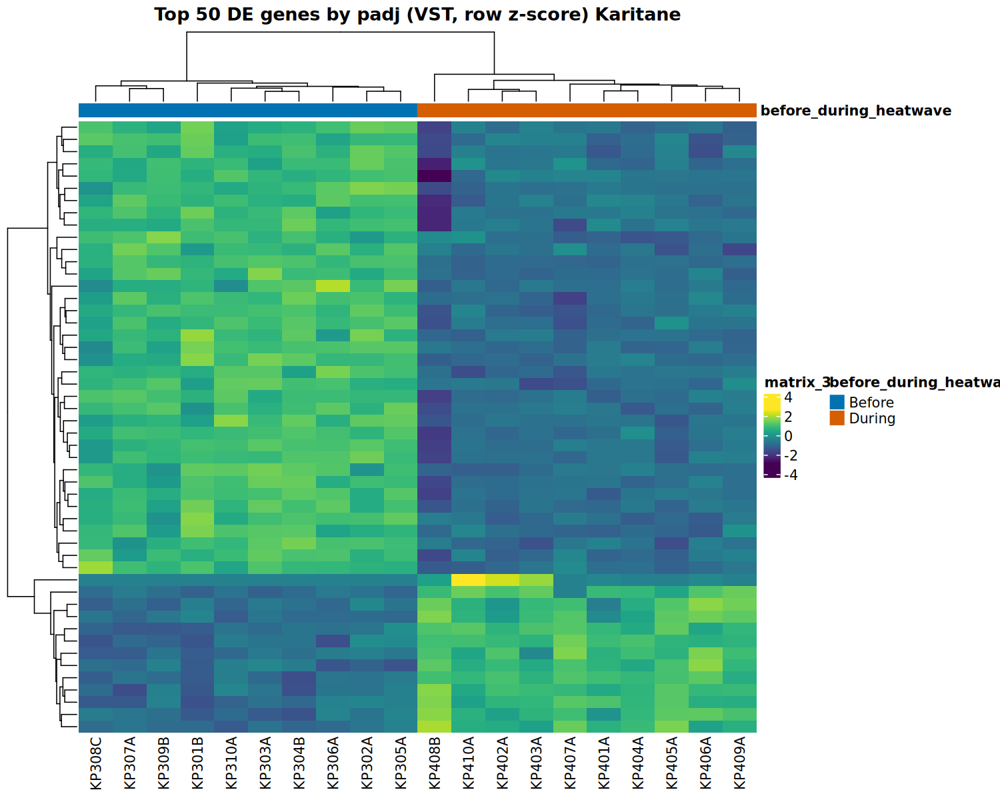

In [56]:
n <- 50

# 1) pick top-N by padj
res_df <- as.data.frame(res_ka)
res_df$gene <- rownames(res_df)

top_by_padj <- res_df %>%
  filter(!is.na(padj)) %>%
  arrange(padj) %>%
  pull(gene) %>%
  unique()

# 2) VST transform
vsd <- vst(dds_ka, blind = FALSE)

genes_in_vsd <- top_by_padj[top_by_padj %in% rownames(vsd)]
genes_sel <- head(genes_in_vsd, n)

# 3) build and scale matrix
mat <- assay(vsd)[genes_sel, , drop = FALSE]
keep <- apply(mat, 1, sd, na.rm = TRUE) > 0
mat <- mat[keep, , drop = FALSE]
mat_scaled <- t(scale(t(mat)))
mat_scaled[is.na(mat_scaled)] <- 0

# 4) sample annotations
candidate_cols <- c("before_during_heatwave", "condition", "timepoint", "group", "batch", "replicate")
have_cols <- intersect(candidate_cols, colnames(colData(vsd)))
ann_col <- if (length(have_cols) > 0) {
  ac <- as.data.frame(colData(vsd)[, have_cols, drop = FALSE])
  rownames(ac) <- colnames(mat_scaled)
  ac
} else NULL

# 5) color palettes
heat_colors <- viridis(100)  # main heatmap palette
annotation_colors <- list(
  before_during_heatwave = c(
    "Before" = "#0072B2",   # blue
    "During" = "#D55E00"    # red-orange
  )
)

# 6) plot
pheatmap(
  mat_scaled,
  color = heat_colors,
  cluster_rows = TRUE, cluster_cols = TRUE,
  show_rownames = FALSE,
  annotation_col = ann_col,
  annotation_colors = annotation_colors,
  main = sprintf("Top %d DE genes by padj (VST, row z-score) Karitane", min(n, nrow(mat_scaled))),
  fontsize_col = 10,
  border_color = NA
)


In [61]:
heat_genes <- read.table("by_heat_only.tsv", sep="\t", header=FALSE)$V1
heat_genes <- unique(heat_genes)

Warning message in scan(file = file, what = what, sep = sep, quote = quote, dec = dec, :
“EOF within quoted string”
Warning message in scan(file = file, what = what, sep = sep, quote = quote, dec = dec, :
“number of items read is not a multiple of the number of columns”


In [62]:
head(heat_genes)

[1] "TRINITY_DN10009_c0_g1"  "TRINITY_DN100292_c0_g1" "TRINITY_DN100589_c0_g1"
[4] "TRINITY_DN100823_c0_g1" "TRINITY_DN10158_c0_g3"  "TRINITY_DN101731_c0_g1"

In [63]:
library(pheatmap)
library(viridis)
library(dplyr)

# Viridis palette for nice perceptually-uniform color
heat_colors <- viridis(100)


Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Heat-annotated genes (VST, row z-score) – Haast' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Heat-annotated genes (VST, row z-score) – Haast' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Heat-annotated genes (VST, row z-score) – Haast' in 'mbcsToSbcs': dot substituted for <93>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Heat-annotated genes (VST, row z-score) – Haast' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Heat-annotated genes (VST, row z-score) – Haast' in 'mbcsToSbcs': dot substituted for <80>”
Warn

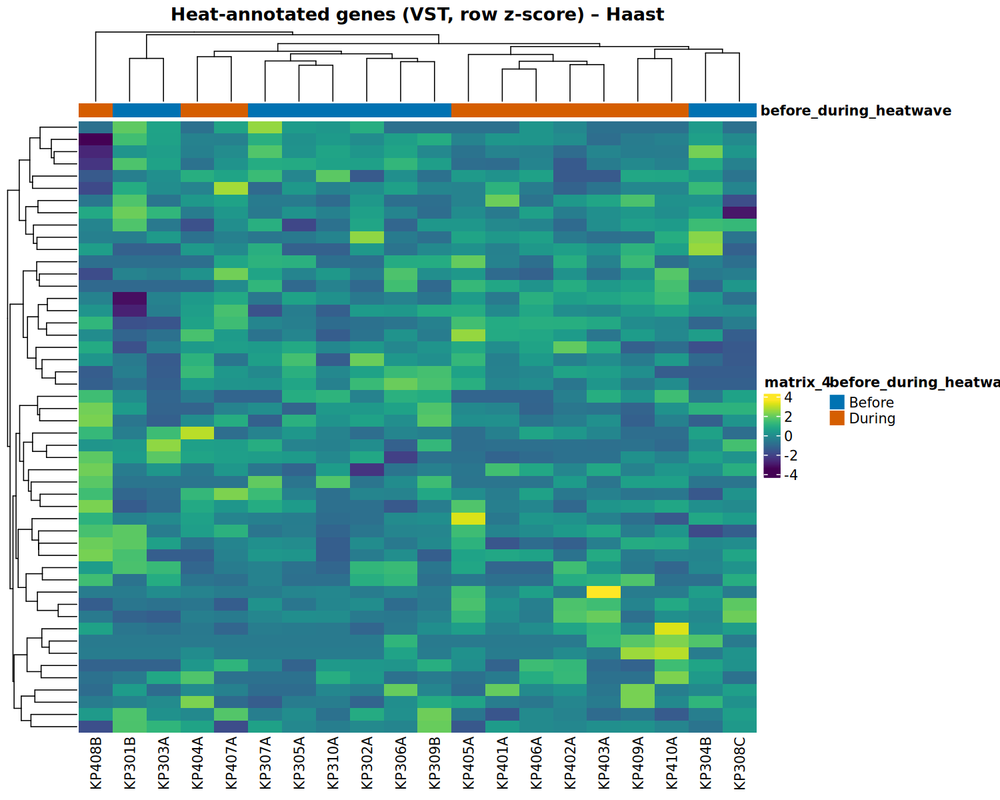

In [64]:
# ---- inputs you need ----
# heat_genes: character vector of gene IDs (e.g., from your GO filter)
# res_ka: DESeq2 results for Karitane (or whatever location you're plotting)
# dds_ka: DESeq2 object for Karitane
n <- 50   # cap rows so the heatmap is readable; adjust as you like

# 1) pick heat-annotated genes (optionally restrict to significant/upregulated)
res_df <- as.data.frame(res_ha)
res_df$gene <- rownames(res_df)

heat_here <- intersect(heat_genes, rownames(res_df))

# If you want *all* heat-annotated genes present in this location:
genes_sel <- heat_here

# Or, if you prefer a cleaner signal: only significant upregulated heat genes
# genes_sel <- with(res_df, gene[gene %in% heat_here & !is.na(padj) & padj < 0.05 & log2FoldChange > 0])

# If there are still many, keep the most responsive ones (by abs LFC or lowest padj)
if (length(genes_sel) > n) {
  ord <- order(abs(res_df[genes_sel, "log2FoldChange"]), decreasing = TRUE)
  genes_sel <- genes_sel[ord][seq_len(n)]
}

# 2) VST transform
vsd <- vst(dds_ka, blind = FALSE)

# 3) build and scale matrix
mat <- assay(vsd)[genes_sel, , drop = TRUE]
mat <- mat[apply(mat, 1, sd, na.rm = TRUE) > 0, , drop = FALSE]
mat_scaled <- t(scale(t(mat)))
mat_scaled[is.na(mat_scaled)] <- 0

# 4) (optional) order columns so Before come first, then During
meta <- as.data.frame(colData(vsd))
if ("before_during_heatwave" %in% names(meta)) {
  ord_cols <- order(factor(meta$before_during_heatwave, levels = c("Before","During")))
  mat_scaled <- mat_scaled[, ord_cols, drop = FALSE]
  meta <- meta[ord_cols, , drop = FALSE]
}

# 5) sample annotations
candidate_cols <- c("before_during_heatwave","condition","timepoint","group","batch","replicate")
have_cols <- intersect(candidate_cols, colnames(meta))
ann_col <- if (length(have_cols)) {
  ac <- meta[, have_cols, drop = FALSE]
  rownames(ac) <- colnames(mat_scaled)
  ac
} else NULL

# 6) colors (viridis for the heatmap)
library(viridis); library(pheatmap)
heat_colors <- viridis(100)
annotation_colors <- list(
  before_during_heatwave = c("Before"="#0072B2","During"="#D55E00")
)

# 7) plot
pheatmap(
  mat_scaled,
  color = heat_colors,
  cluster_rows = TRUE, cluster_cols = TRUE,
  show_rownames = FALSE,
  annotation_col = ann_col,
  annotation_colors = annotation_colors,
  main = sprintf("Heat-annotated genes (VST, row z-score) – %s", "Haast"),
  fontsize_col = 10,
  border_color = NA
)


In [65]:
# heat_genes should be a character vector of your annotated heat-related genes

sig_heat_counts <- function(res, name, heat_genes, padj_thr = 0.05, lfc_thr = 1) {
  df <- as.data.frame(res)
  df$gene <- rownames(df)
  df <- df[!is.na(df$padj), ]
  
  in_set <- df$gene %in% heat_genes
  
  up <- sum(in_set & df$padj < padj_thr & df$log2FoldChange >=  lfc_thr)
  down <- sum(in_set & df$padj < padj_thr & df$log2FoldChange <= -lfc_thr)
  total <- sum(in_set)
  sig_total <- up + down
  
  data.frame(
    location = name,
    total_heat_genes = total,
    sig_up = up,
    sig_down = down,
    sig_total = sig_total
  )
}

ha_counts <- sig_heat_counts(res_ha, "Haast",     heat_genes)
ka_counts <- sig_heat_counts(res_ka, "Karitane",  heat_genes)
ak_counts <- sig_heat_counts(res_ak, "Akaroa",    heat_genes)

heat_summary <- rbind(ha_counts, ka_counts, ak_counts)
heat_summary


location,total_heat_genes,sig_up,sig_down,sig_total
<chr>,<int>,<int>,<int>,<int>
Haast,445,16,7,23
Karitane,450,7,16,23
Akaroa,441,4,3,7


In [66]:
suppressPackageStartupMessages({
  library(dplyr)
  library(tidyr)
})

# --- Helper to extract significant genes + direction ---
get_sig_dir <- function(res, loc_name, padj_thr = 0.05, lfc_thr = 1,
                        restrict_to_heat = FALSE, heat_genes = NULL) {
  df <- as.data.frame(res)
  df$gene <- rownames(df)
  df <- df[!is.na(df$padj), ]

  if (restrict_to_heat) {
    if (is.null(heat_genes)) stop("Provide heat_genes when restrict_to_heat=TRUE")
    df <- df[df$gene %in% heat_genes, ]
  }

  df <- df[df$padj < padj_thr & abs(df$log2FoldChange) >= lfc_thr, ]
  if (!nrow(df)) return(dplyr::tibble(gene=character(), Direction=character(), Location=character()))

  dplyr::tibble(
    gene = df$gene,
    Direction = ifelse(df$log2FoldChange > 0, "Up", "Down"),
    Location = loc_name
  )
}

# --- Significant genes for Haast and Karitane ---
ha_sig <- get_sig_dir(res_ha, "Haast", restrict_to_heat = FALSE)
ka_sig <- get_sig_dir(res_ka, "Karitane", restrict_to_heat = FALSE)

# --- Genes shared between Haast and Karitane ---
shared_HA_KA <- intersect(ha_sig$gene, ka_sig$gene)
length(shared_HA_KA)  # how many shared

# --- Merge directions for shared genes ---
dir_HA_KA <- dplyr::bind_rows(ha_sig, ka_sig) %>%
  dplyr::filter(gene %in% shared_HA_KA) %>%
  tidyr::pivot_wider(id_cols = gene, names_from = Location, values_from = Direction) %>%
  dplyr::mutate(same_direction = Haast == Karitane)

# --- View ---
head(dir_HA_KA)
 table(dir_HA_KA$same_direction)  # count of same vs opposite direction


[1] 960

gene,Haast,Karitane,same_direction
<chr>,<chr>,<chr>,<lgl>
TRINITY_DN10021_c0_g1,Up,Down,FALSE
TRINITY_DN100503_c0_g1,Down,Down,TRUE
TRINITY_DN101039_c0_g2,Up,Up,TRUE
TRINITY_DN101523_c0_g1,Up,Up,TRUE
TRINITY_DN10170_c0_g1,Up,Up,TRUE
TRINITY_DN101998_c0_g1,Down,Down,TRUE



FALSE  TRUE 
  223   737 

In [67]:
# Assuming you already have res_ha and res_ka in memory

library(dplyr)

# --- Helper: get significant gene IDs ---
get_sig_genes <- function(res, padj_thr = 0.05, lfc_thr = 1, heat_only = TRUE, heat_genes = NULL) {
  df <- as.data.frame(res)
  df$gene <- rownames(df)
  df <- df[!is.na(df$padj) & df$padj < padj_thr & abs(df$log2FoldChange) >= lfc_thr, ]
  if (heat_only) {
    if (is.null(heat_genes)) stop("Please provide heat_genes if using heat_only=TRUE")
    df <- df[df$gene %in% heat_genes, ]
  }
  df$gene
}

# Get significant gene IDs for each location
sig_ha <- get_sig_genes(res_ha, heat_only = TRUE, heat_genes = heat_genes)
sig_ka <- get_sig_genes(res_ka, heat_only = TRUE, heat_genes = heat_genes)

# --- Genes significant in BOTH Haast and Karitane ---
shared_ha_ka <- intersect(sig_ha, sig_ka)

# Print them
cat(shared_ha_ka, sep = "\n")

# Optional: check how many
length(shared_ha_ka)


TRINITY_DN12410_c0_g1
TRINITY_DN248869_c0_g1
TRINITY_DN30840_c0_g1
TRINITY_DN5914_c5_g1


[1] 4

In [68]:
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 200)

23 significant heat genes for Haast

Rows in mat after SD filter: 23



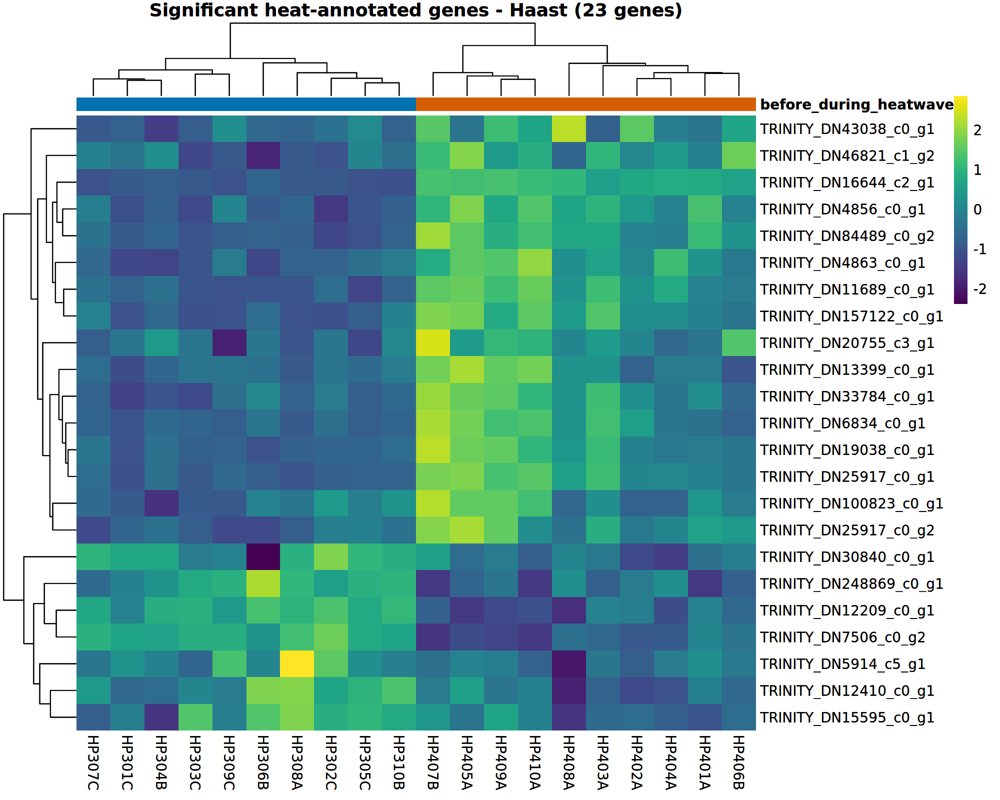

In [91]:
# 1) Significant heat genes for Haast
res_df <- as.data.frame(res_ha)
res_df$gene <- rownames(res_df)

sig_heat_ha <- res_df %>%
  dplyr::filter(
    !is.na(padj),
    padj < 0.05,
    abs(log2FoldChange) >= 1,
    gene %in% heat_genes
  )

message(nrow(sig_heat_ha), " significant heat genes for Haast")

# 2) VST expression
vsd_ha <- vst(dds_ha, blind = FALSE)
expr <- assay(vsd_ha)

genes_sel <- intersect(sig_heat_ha$gene, rownames(expr))
mat <- expr[genes_sel, , drop = FALSE]

# remove zero-variance rows
mat <- mat[apply(mat, 1, sd, na.rm = TRUE) > 0, , drop = FALSE]
message("Rows in mat after SD filter: ", nrow(mat))
if (nrow(mat) == 0) stop("No rows left to plot (all selected genes have zero variance).")

# 3) Row-scale (z-score per gene)
mat_scaled <- t(scale(t(mat)))
mat_scaled[is.na(mat_scaled)] <- 0

# 4) Column annotation (Before vs During)
meta <- as.data.frame(colData(vsd_ha))
ann_col <- data.frame(
  before_during_heatwave = meta$before_during_heatwave
)
rownames(ann_col) <- rownames(meta)

# 5) Colour palettes
heat_colors <- viridis::viridis(100)
annotation_colors <- list(
  before_during_heatwave = c(
    "Before" = "#0072B2",
    "During" = "#D55E00"
  )
)

# 6) Heatmap: no legend, gene names shown (on left)
p <- pheatmap::pheatmap(
  mat_scaled,
  color = heat_colors,
  cluster_rows = TRUE,
  cluster_cols = TRUE,
  show_rownames = TRUE,          # show gene names
  fontsize_row = 10,              # tweak as needed
  show_column_names = FALSE,
  annotation_col = ann_col,
  annotation_colors = annotation_colors,
  border_color = NA,
  main = sprintf("Significant heat-annotated genes - Haast (%d genes)",
                 nrow(mat)),
  fontsize_col = 10,
  legend = TRUE,                # hide main legend
  annotation_legend = FALSE      # hide annotation legend
)

print(p)


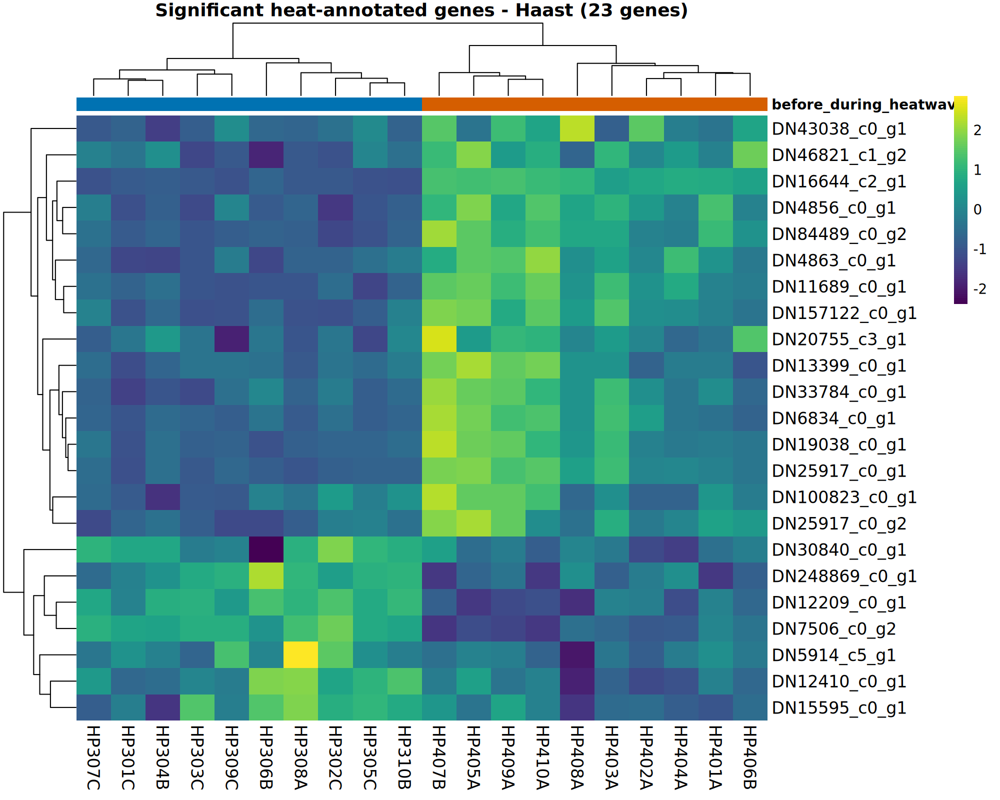

In [92]:
# Remove "TRINITY_" from gene names in sig_heat_ak
sig_heat_ha$gene <- sub("^TRINITY_", "", sig_heat_ha$gene)

# Also update rownames of your expression matrix (optional)
rownames(mat_scaled) <- sub("^TRINITY_", "", rownames(mat_scaled))

# Re-run the heatmap to reflect the cleaned names
p <- pheatmap::pheatmap(
  mat_scaled,
  color = heat_colors,
  cluster_rows = TRUE,
  cluster_cols = TRUE,
  show_rownames = TRUE,
  fontsize_row = 12,
  show_column_names = FALSE,
  annotation_col = ann_col,
  annotation_colors = annotation_colors,
  border_color = NA,
  main = sprintf("Significant heat-annotated genes - Haast (%d genes)", nrow(mat_scaled)),
  fontsize_col = 12,
  legend = TRUE,
  annotation_legend = FALSE
)


In [93]:
ggplot2::ggsave("haast_heatmap.png", p$gtable, width = 10, height = 8, dpi = 300)

In [70]:
genes_to_plot <- rownames(mat_scaled)
cat(genes_to_plot, sep = "\n")


TRINITY_DN100823_c0_g1
TRINITY_DN11689_c0_g1
TRINITY_DN12209_c0_g1
TRINITY_DN12410_c0_g1
TRINITY_DN13399_c0_g1
TRINITY_DN15595_c0_g1
TRINITY_DN157122_c0_g1
TRINITY_DN16644_c2_g1
TRINITY_DN19038_c0_g1
TRINITY_DN20755_c3_g1
TRINITY_DN248869_c0_g1
TRINITY_DN25917_c0_g1
TRINITY_DN25917_c0_g2
TRINITY_DN30840_c0_g1
TRINITY_DN33784_c0_g1
TRINITY_DN43038_c0_g1
TRINITY_DN46821_c1_g2
TRINITY_DN4856_c0_g1
TRINITY_DN4863_c0_g1
TRINITY_DN5914_c5_g1
TRINITY_DN6834_c0_g1
TRINITY_DN7506_c0_g2
TRINITY_DN84489_c0_g2


In [218]:
ggplot2::ggsave("haast_heatmap.png", p$gtable, width = 10, height = 8, dpi = 300)


23 significant heat genes for Karitane

Rows in mat after SD filter: 23



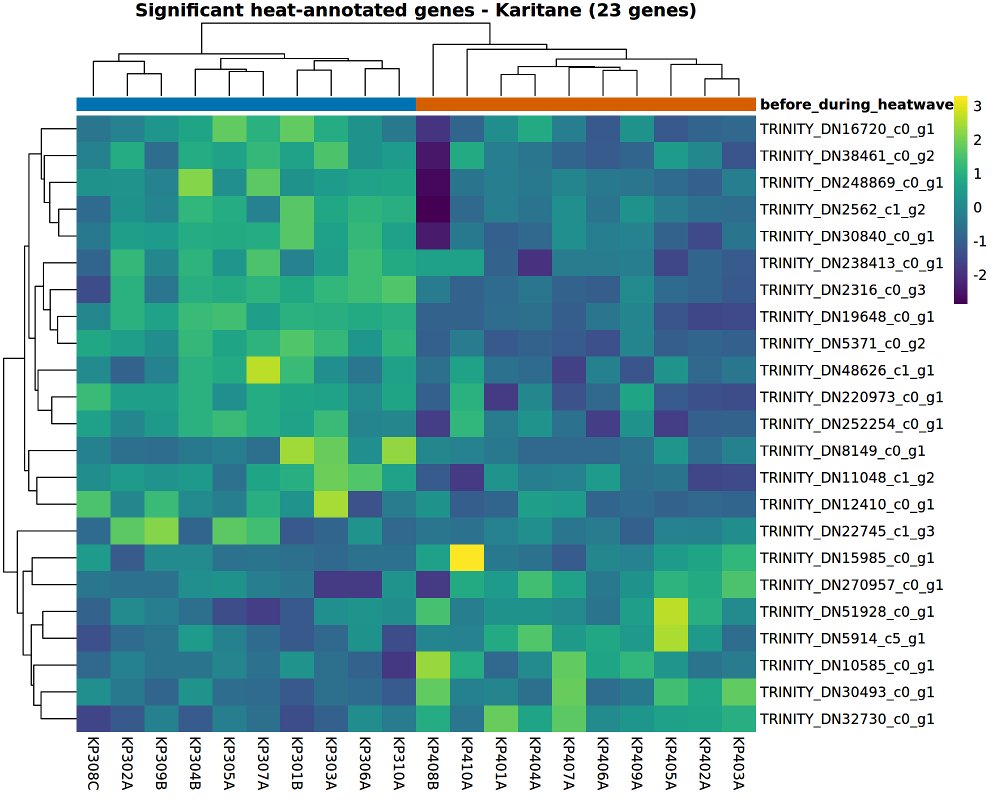

In [94]:
# 1) Significant heat genes for karitane
res_df <- as.data.frame(res_ka)
res_df$gene <- rownames(res_df)

sig_heat_ka <- res_df %>%
  dplyr::filter(
    !is.na(padj),
    padj < 0.05,
    abs(log2FoldChange) >= 1,
    gene %in% heat_genes
  )

message(nrow(sig_heat_ka), " significant heat genes for Karitane")

# 2) VST expression
vsd_ka <- vst(dds_ka, blind = FALSE)
expr <- assay(vsd_ka)

genes_sel <- intersect(sig_heat_ka$gene, rownames(expr))
mat <- expr[genes_sel, , drop = FALSE]

# remove zero-variance rows
mat <- mat[apply(mat, 1, sd, na.rm = TRUE) > 0, , drop = FALSE]
message("Rows in mat after SD filter: ", nrow(mat))
if (nrow(mat) == 0) stop("No rows left to plot (all selected genes have zero variance).")

# 3) Row-scale (z-score per gene)
mat_scaled <- t(scale(t(mat)))
mat_scaled[is.na(mat_scaled)] <- 0

# 4) Column annotation (Before vs During)
meta <- as.data.frame(colData(vsd_ka))
ann_col <- data.frame(
  before_during_heatwave = meta$before_during_heatwave
)
rownames(ann_col) <- rownames(meta)

# 5) Colour palettes
heat_colors <- viridis::viridis(100)
annotation_colors <- list(
  before_during_heatwave = c(
    "Before" = "#0072B2",
    "During" = "#D55E00"
  )
)

# 6) Heatmap: no legend, gene names shown (on left)
p <- pheatmap::pheatmap(
  mat_scaled,
  color = heat_colors,
  cluster_rows = TRUE,
  cluster_cols = TRUE,
  show_rownames = TRUE,          # show gene names
  fontsize_row = 10,              # tweak as needed
  show_column_names = FALSE,
  annotation_col = ann_col,
  annotation_colors = annotation_colors,
  border_color = NA,
  main = sprintf("Significant heat-annotated genes - Karitane (%d genes)",
                 nrow(mat)),
  fontsize_col = 10,
  legend = TRUE,                # hide main legend
  annotation_legend = FALSE      # hide annotation legend
)

print(p)


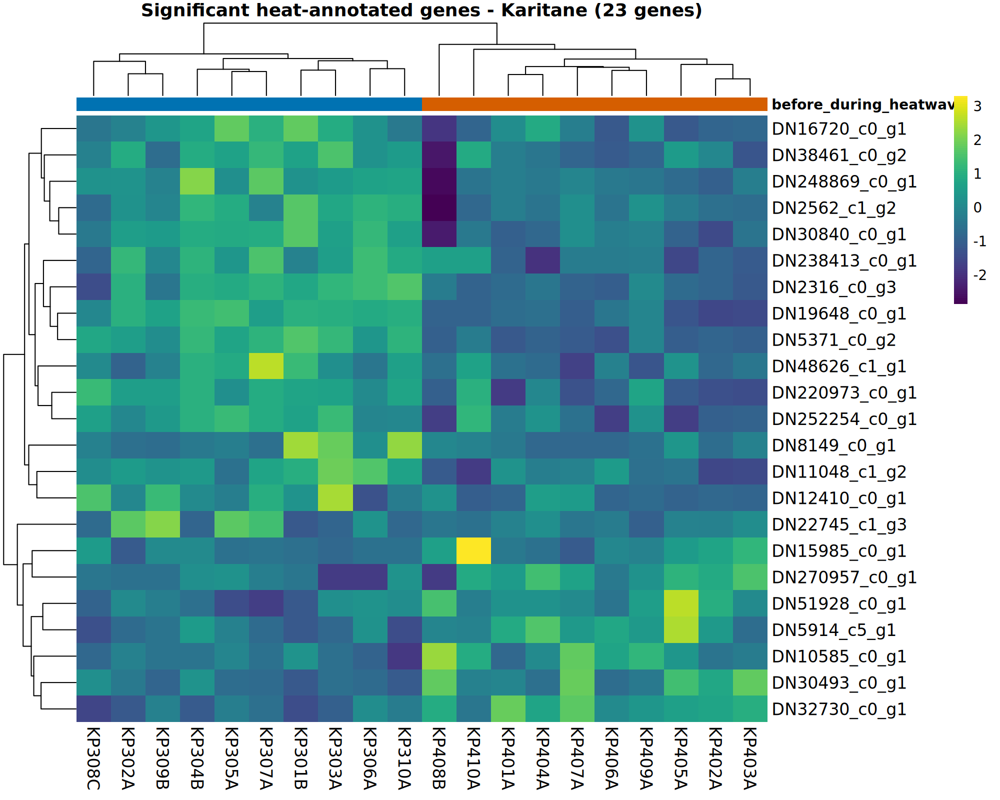

In [95]:
# Remove "TRINITY_" from gene names in sig_heat_ak
sig_heat_ka$gene <- sub("^TRINITY_", "", sig_heat_ka$gene)

# Also update rownames of your expression matrix (optional)
rownames(mat_scaled) <- sub("^TRINITY_", "", rownames(mat_scaled))

# Re-run the heatmap to reflect the cleaned names
p <- pheatmap::pheatmap(
  mat_scaled,
  color = heat_colors,
  cluster_rows = TRUE,
  cluster_cols = TRUE,
  show_rownames = TRUE,
  fontsize_row = 12,
  show_column_names = FALSE,
  annotation_col = ann_col,
  annotation_colors = annotation_colors,
  border_color = NA,
  main = sprintf("Significant heat-annotated genes - Karitane (%d genes)", nrow(mat_scaled)),
  fontsize_col = 12,
  legend = TRUE,
  annotation_legend = FALSE
)


In [96]:
ggplot2::ggsave("Karitane_heatmap.png", p$gtable, width = 10, height = 8, dpi = 300)

In [72]:
genes_to_plot <- rownames(mat_scaled)
cat(genes_to_plot, sep = "\n")


TRINITY_DN10585_c0_g1
TRINITY_DN11048_c1_g2
TRINITY_DN12410_c0_g1
TRINITY_DN15985_c0_g1
TRINITY_DN16720_c0_g1
TRINITY_DN19648_c0_g1
TRINITY_DN220973_c0_g1
TRINITY_DN22745_c1_g3
TRINITY_DN2316_c0_g3
TRINITY_DN238413_c0_g1
TRINITY_DN248869_c0_g1
TRINITY_DN252254_c0_g1
TRINITY_DN2562_c1_g2
TRINITY_DN270957_c0_g1
TRINITY_DN30493_c0_g1
TRINITY_DN30840_c0_g1
TRINITY_DN32730_c0_g1
TRINITY_DN38461_c0_g2
TRINITY_DN48626_c1_g1
TRINITY_DN51928_c0_g1
TRINITY_DN5371_c0_g2
TRINITY_DN5914_c5_g1
TRINITY_DN8149_c0_g1


In [244]:
ggplot2::ggsave("Karitane_heatmap.png", p$gtable, width = 10, height = 8, dpi = 300)

7 significant heat genes for Akaroa



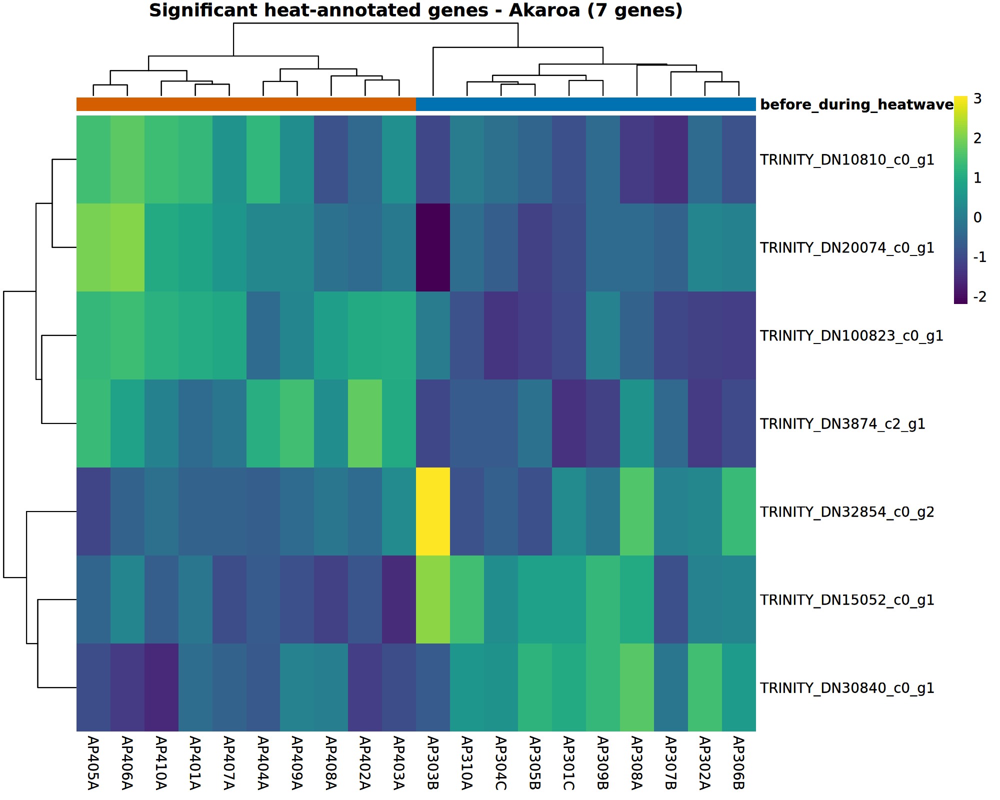

In [73]:
# --- 1) Significant heat genes for Akaroa ---
res_df <- as.data.frame(res_ak)
res_df$gene <- rownames(res_df)

sig_heat_ak <- res_df %>%
  dplyr::filter(
    !is.na(padj),
    padj < 0.05,
    abs(log2FoldChange) >= 1,
    gene %in% heat_genes
  )

message(nrow(sig_heat_ak), " significant heat genes for Akaroa")

# --- 2) VST expression ---
vsd_ak <- vst(dds_ak, blind = FALSE)
expr <- assay(vsd_ak)

genes_sel <- intersect(sig_heat_ak$gene, rownames(expr))
mat <- expr[genes_sel, , drop = FALSE]
mat <- mat[apply(mat, 1, sd, na.rm = TRUE) > 0, , drop = FALSE]
if (nrow(mat) == 0) stop("No rows left to plot (all selected genes have zero variance).")

# --- 3) Row-scale (z-score per gene) ---
mat_scaled <- t(scale(t(mat)))
mat_scaled[is.na(mat_scaled)] <- 0

# --- 4) Column annotation ---
meta <- as.data.frame(colData(vsd_ak))
ann_col <- data.frame(
  before_during_heatwave = meta$before_during_heatwave
)
rownames(ann_col) <- rownames(meta)

# --- 5) Reorder columns so 'Before' samples come first ---
# get sample order from annotation
order_samples <- order(ann_col$before_during_heatwave, decreasing = TRUE)
# reorder both the matrix and annotation data frame
mat_scaled <- mat_scaled[, order_samples]
ann_col <- ann_col[order_samples, , drop = FALSE]

# --- 6) Colour palettes ---
heat_colors <- viridis::viridis(100)
annotation_colors <- list(
  before_during_heatwave = c("Before" = "#0072B2", "During" = "#D55E00")
)

# --- 7) Heatmap (no annotation legend, gene names visible) ---
p <- pheatmap::pheatmap(
  mat_scaled,
  color = heat_colors,
  cluster_rows = TRUE,
  cluster_cols = TRUE,          # turn OFF column clustering to keep your order
  show_rownames = TRUE,
  fontsize_row = 10,
  show_column_names = FALSE,
  annotation_col = ann_col,
  annotation_colors = annotation_colors,
  border_color = NA,
  main = sprintf("Significant heat-annotated genes - Akaroa (%d genes)", nrow(mat)),
  fontsize_col = 10,
  legend = TRUE,
  annotation_legend = FALSE
)

print(p)


In [74]:
genes_to_plot <- rownames(mat_scaled)
cat(genes_to_plot, sep = "\n")

TRINITY_DN100823_c0_g1
TRINITY_DN10810_c0_g1
TRINITY_DN15052_c0_g1
TRINITY_DN20074_c0_g1
TRINITY_DN30840_c0_g1
TRINITY_DN32854_c0_g2
TRINITY_DN3874_c2_g1


7 significant heat genes for Akaroa

Rows in mat after SD filter: 7



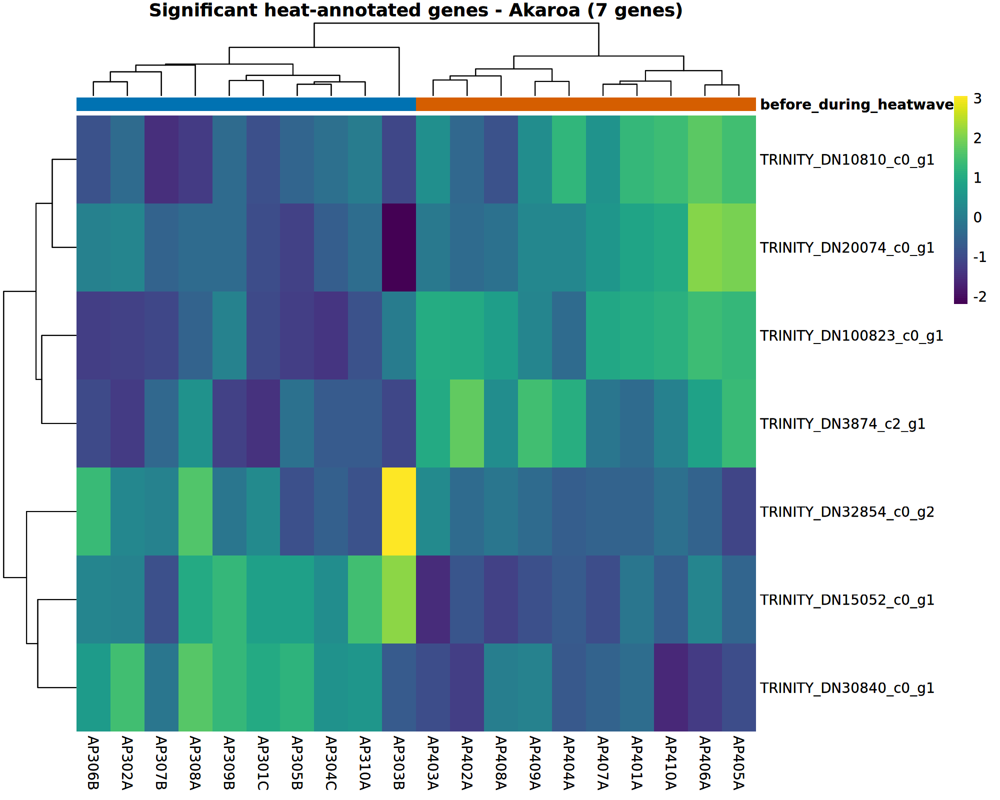

In [75]:
# 1) Significant heat genes for Akaroa
res_df <- as.data.frame(res_ak)
res_df$gene <- rownames(res_df)

sig_heat_ak <- res_df %>%
  dplyr::filter(
    !is.na(padj),
    padj < 0.05,
    abs(log2FoldChange) >= 1,
    gene %in% heat_genes
  )

message(nrow(sig_heat_ak), " significant heat genes for Akaroa")

# 2) VST expression
vsd_ak <- vst(dds_ak, blind = FALSE)
expr <- assay(vsd_ak)

genes_sel <- intersect(sig_heat_ak$gene, rownames(expr))
mat <- expr[genes_sel, , drop = FALSE]

# remove zero-variance rows
mat <- mat[apply(mat, 1, sd, na.rm = TRUE) > 0, , drop = FALSE]
message("Rows in mat after SD filter: ", nrow(mat))
if (nrow(mat) == 0) stop("No rows left to plot (all selected genes have zero variance).")

# 3) Row-scale (z-score per gene)
mat_scaled <- t(scale(t(mat)))
mat_scaled[is.na(mat_scaled)] <- 0

# 4) Column annotation (Before vs During)
meta <- as.data.frame(colData(vsd_ak))
ann_col <- data.frame(
  before_during_heatwave = meta$before_during_heatwave
)
rownames(ann_col) <- rownames(meta)

# 5) Colour palettes
heat_colors <- viridis::viridis(100)
annotation_colors <- list(
  before_during_heatwave = c(
    "Before" = "#0072B2",
    "During" = "#D55E00"
  )
)

# 5b) Build the column clustering and flip it
col_dist    <- dist(t(mat_scaled))
col_hclust  <- hclust(col_dist, method = "complete")

# flip the order in the hclust object
col_hclust$order <- rev(col_hclust$order)

# 6) Heatmap: keep clustering, but use our flipped tree
p <- pheatmap::pheatmap(
  mat_scaled,
  color = heat_colors,
  cluster_rows = TRUE,
  cluster_cols = col_hclust,   # <-- pass hclust directly
  show_rownames = TRUE,
  fontsize_row = 10,
  show_column_names = FALSE,
  annotation_col = ann_col,
  annotation_colors = annotation_colors,
  border_color = NA,
  main = sprintf("Significant heat-annotated genes - Akaroa (%d genes)",
                 nrow(mat)),
  fontsize_col = 10,
  legend = TRUE,
  annotation_legend = FALSE
)

print(p)


In [257]:
ggplot2::ggsave("Akaroa_heatmap.png", p$gtable, width = 10, height = 8, dpi = 300)

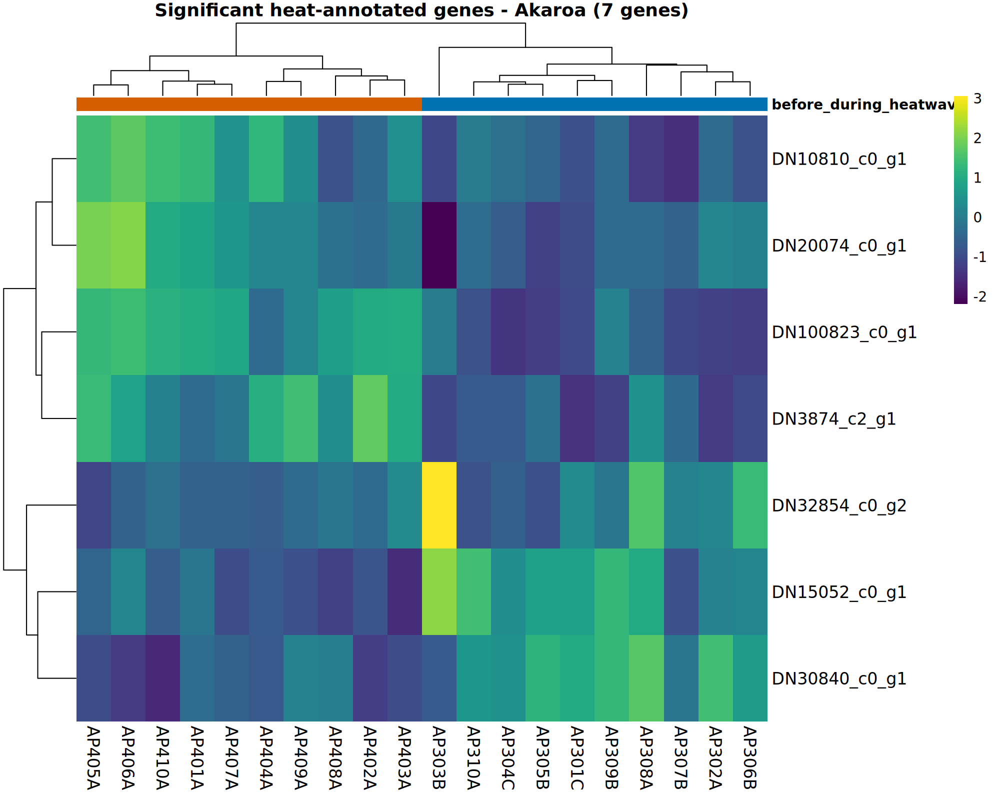

In [83]:
# Remove "TRINITY_" from gene names in sig_heat_ak
sig_heat_ak$gene <- sub("^TRINITY_", "", sig_heat_ak$gene)

# Also update rownames of your expression matrix (optional)
rownames(mat_scaled) <- sub("^TRINITY_", "", rownames(mat_scaled))

# Re-run the heatmap to reflect the cleaned names
p <- pheatmap::pheatmap(
  mat_scaled,
  color = heat_colors,
  cluster_rows = TRUE,
  cluster_cols = TRUE,
  show_rownames = TRUE,
  fontsize_row = 12,
  show_column_names = FALSE,
  annotation_col = ann_col,
  annotation_colors = annotation_colors,
  border_color = NA,
  main = sprintf("Significant heat-annotated genes - Akaroa (%d genes)", nrow(mat_scaled)),
  fontsize_col = 12,
  legend = TRUE,
  annotation_legend = FALSE
)


In [84]:
ggplot2::ggsave("Akaroa_heatmap.png", p$gtable, width = 10, height = 8, dpi = 300)

In [65]:
# --- Load the eggNOG emapper file ---
library(data.table)

# Path to your annotation file
emapper_path <- "emapper_geneBest.annotations.tsv"

# Read only needed columns (gene id = 1, COG category = 7)
emm <- data.table::fread(
  emapper_path,
  sep = "\t",
  header = TRUE,
  quote = "",
  fill = TRUE,
  select = c(1,7),
  col.names = c("gene", "COG_cat")
)

# --- Quick sanity checks ---
dim(emm)         # number of rows and columns
head(emm)        # preview first few lines
summary(emm$COG_cat)  # see how COG categories are distributed


[1] 46694     2

gene,COG_cat
<chr>,<chr>
TRINITY_DN0_c1_g1,S
TRINITY_DN0_c1_g2,I
TRINITY_DN0_c318_g1,S
TRINITY_DN0_c3_g1,S
TRINITY_DN0_c4_g2,J
TRINITY_DN0_c8_g2,J


   Length     Class      Mode 
    46694 character character 

In [102]:
# Save the Haast results table to a CSV file
write.csv(as.data.frame(res_ha),
          file = "res_ha.csv",
          row.names = TRUE)


In [103]:
# Save the Haast results table to a CSV file
write.csv(as.data.frame(res_ka),
          file = "res_ka.csv",
          row.names = TRUE)


In [104]:
# Save the Haast results table to a CSV file
write.csv(as.data.frame(res_ak),
          file = "res_ak.csv",
          row.names = TRUE)


In [80]:
# Bigger inline figures in Jupyter (IRkernel)
options(repr.plot.width = 18,  # inches
        repr.plot.height = 12,
        repr.plot.res = 150)   # DPI for inline display

In [80]:
citation()
version$version.string


To cite R in publications use:

  R Core Team (2024). _R: A Language and Environment for Statistical
  Computing_. R Foundation for Statistical Computing, Vienna, Austria.
  <https://www.R-project.org/>.

A BibTeX entry for LaTeX users is

  @Manual{,
    title = {R: A Language and Environment for Statistical Computing},
    author = {{R Core Team}},
    organization = {R Foundation for Statistical Computing},
    address = {Vienna, Austria},
    year = {2024},
    url = {https://www.R-project.org/},
  }

We have invested a lot of time and effort in creating R, please cite it
when using it for data analysis. See also ‘citation("pkgname")’ for
citing R packages.

[1] "R version 4.3.3 (2024-02-29)"

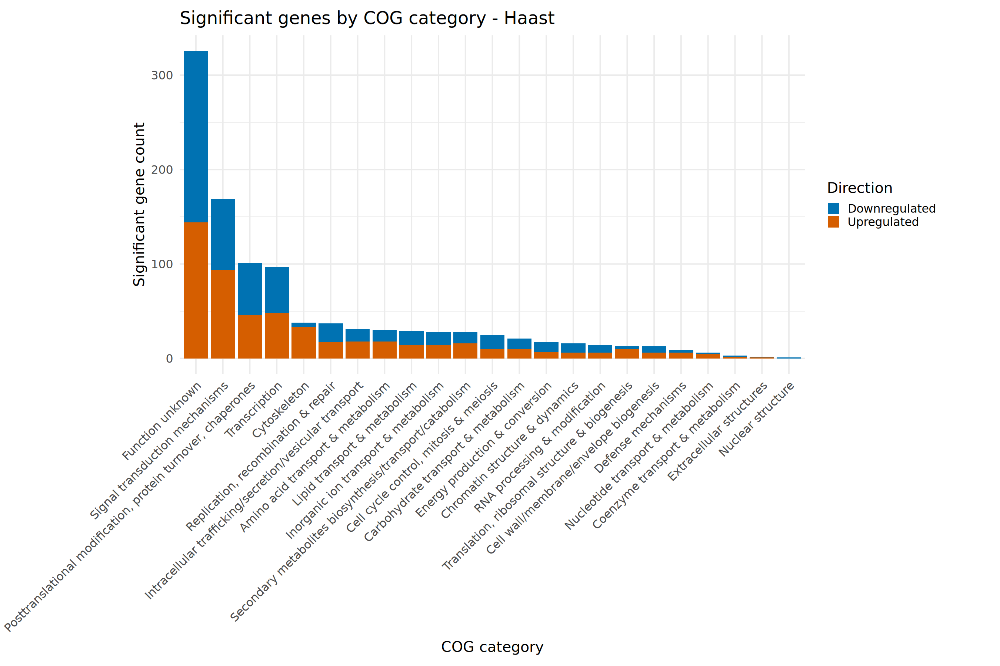

In [81]:
# ---- Packages ----
suppressPackageStartupMessages({
  library(data.table)
  library(ggplot2)
  library(dplyr)
  library(tidyr)
  library(stringr)
})

# ---- Inputs you already have ----
# res_ha : DESeq2 results for Haast (rows = genes)
# emapper_path : path to "emapper_geneBest.annotations.tsv" (col1=gene, col7=COG)
# If not set: emapper_path <- "emapper_geneBest.annotations.tsv"

# ---- 1) Read gene↔COG (only needed columns) ----
emm <- data.table::fread(
  emapper_path,
  sep = "\t", header = TRUE, quote = "", fill = TRUE,
  select = c(1,7), col.names = c("gene","COG_cat")
)

# ---- 2) Significant genes for Haast (padj<0.05 & |LFC|>=1) ----
res_df <- as.data.frame(res_ha)
res_df$gene <- rownames(res_df)

sig_ha <- res_df %>%
  dplyr::filter(!is.na(padj), padj < 0.05, abs(log2FoldChange) >= 1) %>%
  dplyr::mutate(Direction = ifelse(log2FoldChange > 0, "Upregulated", "Downregulated")) %>%
  dplyr::select(gene, Direction)

# ---- 3) Join to COGs and expand multi-letter categories (e.g., "JKM") ----
sig_ha_cog <- sig_ha %>%
  dplyr::inner_join(emm, by = "gene") %>%
  dplyr::mutate(COG_cat = gsub("[^A-Za-z]", "", COG_cat)) %>%  # keep only letters
  dplyr::mutate(COG = stringr::str_split(COG_cat, "")) %>%
  tidyr::unnest(COG) %>%
  dplyr::filter(!is.na(COG), COG != "")

# ---- 4) Count per COG & Direction; order COGs by total (largest left) ----
counts <- sig_ha_cog %>%
  dplyr::count(COG, Direction, name = "n") %>%
  dplyr::group_by(COG) %>%
  dplyr::mutate(total = sum(n)) %>%
  dplyr::ungroup() %>%
  dplyr::arrange(dplyr::desc(total)) %>%
  dplyr::mutate(COG = factor(COG, levels = unique(COG)))

# ---- 5) COG letter → description (for axis labels) ----
cog_legend <- c(
  A="RNA processing & modification",        B="Chromatin structure & dynamics",
  C="Energy production & conversion",       D="Cell cycle control, mitosis & meiosis",
  E="Amino acid transport & metabolism",    F="Nucleotide transport & metabolism",
  G="Carbohydrate transport & metabolism",  H="Coenzyme transport & metabolism",
  I="Lipid transport & metabolism",         J="Translation, ribosomal structure & biogenesis",
  K="Transcription",                        L="Replication, recombination & repair",
  M="Cell wall/membrane/envelope biogenesis", N="Cell motility",
  O="Posttranslational modification, protein turnover, chaperones",
  P="Inorganic ion transport & metabolism", Q="Secondary metabolites biosynthesis/transport/catabolism",
  R="General function prediction only",     S="Function unknown",
  T="Signal transduction mechanisms",       U="Intracellular trafficking/secretion/vesicular transport",
  V="Defense mechanisms",                   W="Extracellular structures",
  Y="Nuclear structure",                    Z="Cytoskeleton"
)

# ---- 6) Plot: stacked bars, biggest on the left ----
ggplot(counts, aes(x = COG, y = n, fill = Direction)) +
  geom_col() +
  scale_fill_manual(values = c("Upregulated" = "#D55E00", "Downregulated" = "#0072B2")) +
  scale_x_discrete(labels = function(x) cog_legend[x]) +
  labs(
    title = "Significant genes by COG category - Haast",
    x = "COG category", y = "Significant gene count", fill = "Direction"
  ) +
  theme_minimal(base_size = 19) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))+ theme(
    axis.text.x = element_text(angle = 45, hjust = 1),
    plot.margin = grid::unit(c(1, 5, 1, 12), "lines")  # top, right, bottom, left
  )



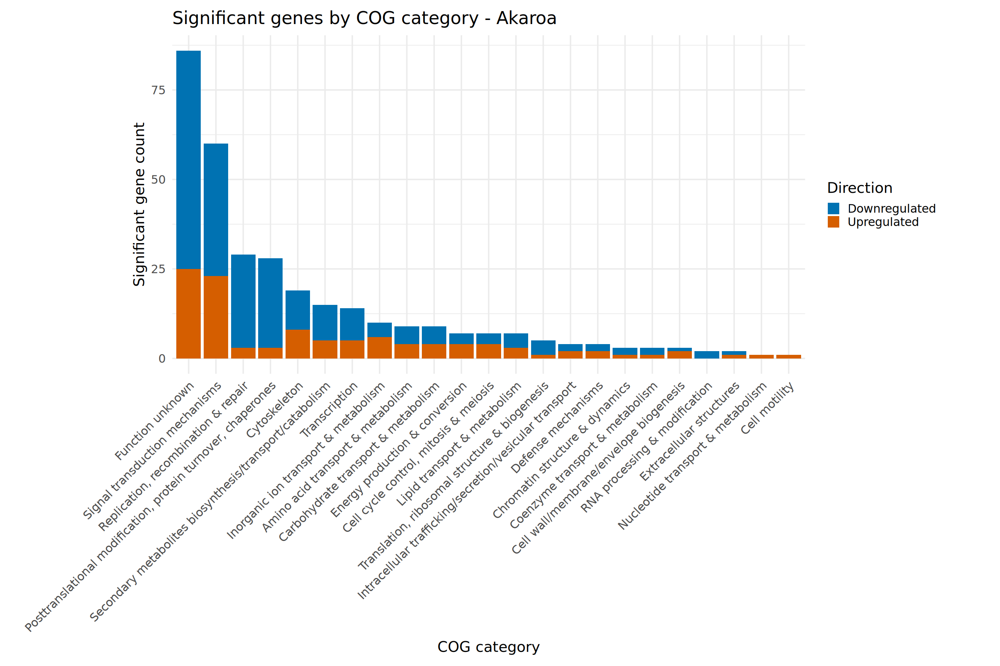

In [83]:
# ---- Packages ----
suppressPackageStartupMessages({
  library(data.table)
  library(ggplot2)
  library(dplyr)
  library(tidyr)
  library(stringr)
})

# ---- Inputs you already have ----
# res_ha : DESeq2 results for Haast (rows = genes)
# emapper_path : path to "emapper_geneBest.annotations.tsv" (col1=gene, col7=COG)
# If not set: emapper_path <- "emapper_geneBest.annotations.tsv"

# ---- 1) Read gene↔COG (only needed columns) ----
emm <- data.table::fread(
  emapper_path,
  sep = "\t", header = TRUE, quote = "", fill = TRUE,
  select = c(1,7), col.names = c("gene","COG_cat")
)

# ---- 2) Significant genes for Haast (padj<0.05 & |LFC|>=1) ----
res_df <- as.data.frame(res_ak)
res_df$gene <- rownames(res_df)

sig_ha <- res_df %>%
  dplyr::filter(!is.na(padj), padj < 0.05, abs(log2FoldChange) >= 1) %>%
  dplyr::mutate(Direction = ifelse(log2FoldChange > 0, "Upregulated", "Downregulated")) %>%
  dplyr::select(gene, Direction)

# ---- 3) Join to COGs and expand multi-letter categories (e.g., "JKM") ----
sig_ha_cog <- sig_ha %>%
  dplyr::inner_join(emm, by = "gene") %>%
  dplyr::mutate(COG_cat = gsub("[^A-Za-z]", "", COG_cat)) %>%  # keep only letters
  dplyr::mutate(COG = stringr::str_split(COG_cat, "")) %>%
  tidyr::unnest(COG) %>%
  dplyr::filter(!is.na(COG), COG != "")

# ---- 4) Count per COG & Direction; order COGs by total (largest left) ----
counts <- sig_ha_cog %>%
  dplyr::count(COG, Direction, name = "n") %>%
  dplyr::group_by(COG) %>%
  dplyr::mutate(total = sum(n)) %>%
  dplyr::ungroup() %>%
  dplyr::arrange(dplyr::desc(total)) %>%
  dplyr::mutate(COG = factor(COG, levels = unique(COG)))

# ---- 5) COG letter → description (for axis labels) ----
cog_legend <- c(
  A="RNA processing & modification",        B="Chromatin structure & dynamics",
  C="Energy production & conversion",       D="Cell cycle control, mitosis & meiosis",
  E="Amino acid transport & metabolism",    F="Nucleotide transport & metabolism",
  G="Carbohydrate transport & metabolism",  H="Coenzyme transport & metabolism",
  I="Lipid transport & metabolism",         J="Translation, ribosomal structure & biogenesis",
  K="Transcription",                        L="Replication, recombination & repair",
  M="Cell wall/membrane/envelope biogenesis", N="Cell motility",
  O="Posttranslational modification, protein turnover, chaperones",
  P="Inorganic ion transport & metabolism", Q="Secondary metabolites biosynthesis/transport/catabolism",
  R="General function prediction only",     S="Function unknown",
  T="Signal transduction mechanisms",       U="Intracellular trafficking/secretion/vesicular transport",
  V="Defense mechanisms",                   W="Extracellular structures",
  Y="Nuclear structure",                    Z="Cytoskeleton"
)

# ---- 6) Plot: stacked bars, biggest on the left ----
ggplot(counts, aes(x = COG, y = n, fill = Direction)) +
  geom_col() +
  scale_fill_manual(values = c("Upregulated" = "#D55E00", "Downregulated" = "#0072B2")) +
  scale_x_discrete(labels = function(x) cog_legend[x]) +
  labs(
    title = "Significant genes by COG category - Akaroa",
    x = "COG category", y = "Significant gene count", fill = "Direction"
  ) +
  theme_minimal(base_size = 19) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))+ theme(
    axis.text.x = element_text(angle = 45, hjust = 1),
    plot.margin = grid::unit(c(1, 5, 1, 12), "lines")  # top, right, bottom, left
  )



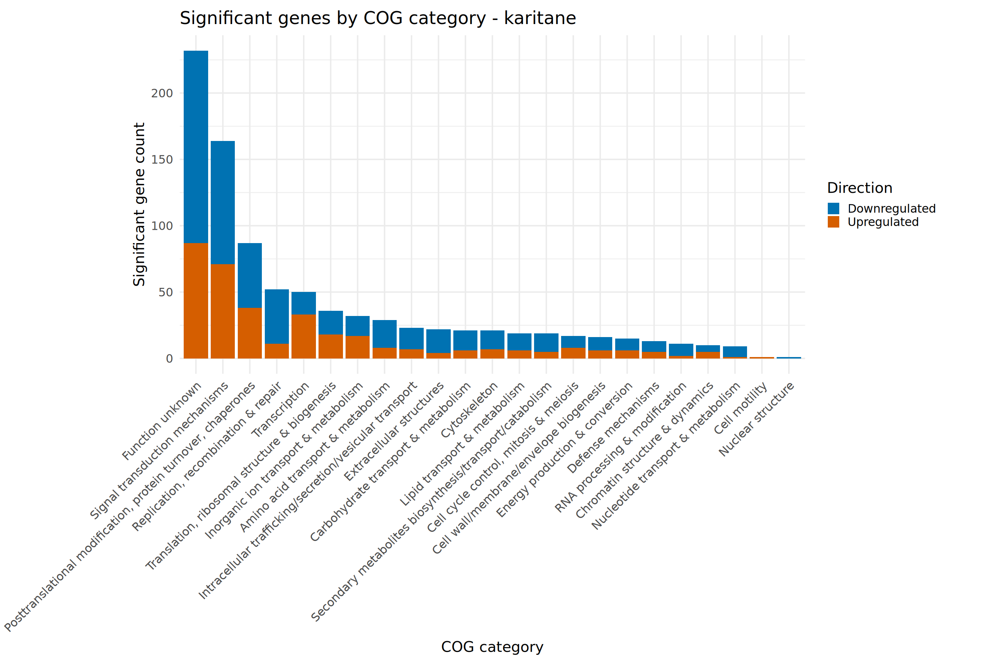

In [82]:
# ---- Packages ----
suppressPackageStartupMessages({
  library(data.table)
  library(ggplot2)
  library(dplyr)
  library(tidyr)
  library(stringr)
})

# ---- Inputs you already have ----
# res_ha : DESeq2 results for Haast (rows = genes)
# emapper_path : path to "emapper_geneBest.annotations.tsv" (col1=gene, col7=COG)
# If not set: emapper_path <- "emapper_geneBest.annotations.tsv"

# ---- 1) Read gene↔COG (only needed columns) ----
emm <- data.table::fread(
  emapper_path,
  sep = "\t", header = TRUE, quote = "", fill = TRUE,
  select = c(1,7), col.names = c("gene","COG_cat")
)

# ---- 2) Significant genes for Haast (padj<0.05 & |LFC|>=1) ----
res_df <- as.data.frame(res_ka)
res_df$gene <- rownames(res_df)

sig_ha <- res_df %>%
  dplyr::filter(!is.na(padj), padj < 0.05, abs(log2FoldChange) >= 1) %>%
  dplyr::mutate(Direction = ifelse(log2FoldChange > 0, "Upregulated", "Downregulated")) %>%
  dplyr::select(gene, Direction)

# ---- 3) Join to COGs and expand multi-letter categories (e.g., "JKM") ----
sig_ha_cog <- sig_ha %>%
  dplyr::inner_join(emm, by = "gene") %>%
  dplyr::mutate(COG_cat = gsub("[^A-Za-z]", "", COG_cat)) %>%  # keep only letters
  dplyr::mutate(COG = stringr::str_split(COG_cat, "")) %>%
  tidyr::unnest(COG) %>%
  dplyr::filter(!is.na(COG), COG != "")

# ---- 4) Count per COG & Direction; order COGs by total (largest left) ----
counts <- sig_ha_cog %>%
  dplyr::count(COG, Direction, name = "n") %>%
  dplyr::group_by(COG) %>%
  dplyr::mutate(total = sum(n)) %>%
  dplyr::ungroup() %>%
  dplyr::arrange(dplyr::desc(total)) %>%
  dplyr::mutate(COG = factor(COG, levels = unique(COG)))

# ---- 5) COG letter → description (for axis labels) ----
cog_legend <- c(
  A="RNA processing & modification",        B="Chromatin structure & dynamics",
  C="Energy production & conversion",       D="Cell cycle control, mitosis & meiosis",
  E="Amino acid transport & metabolism",    F="Nucleotide transport & metabolism",
  G="Carbohydrate transport & metabolism",  H="Coenzyme transport & metabolism",
  I="Lipid transport & metabolism",         J="Translation, ribosomal structure & biogenesis",
  K="Transcription",                        L="Replication, recombination & repair",
  M="Cell wall/membrane/envelope biogenesis", N="Cell motility",
  O="Posttranslational modification, protein turnover, chaperones",
  P="Inorganic ion transport & metabolism", Q="Secondary metabolites biosynthesis/transport/catabolism",
  R="General function prediction only",     S="Function unknown",
  T="Signal transduction mechanisms",       U="Intracellular trafficking/secretion/vesicular transport",
  V="Defense mechanisms",                   W="Extracellular structures",
  Y="Nuclear structure",                    Z="Cytoskeleton"
)

# ---- 6) Plot: stacked bars, biggest on the left ----
ggplot(counts, aes(x = COG, y = n, fill = Direction)) +
  geom_col() +
  scale_fill_manual(values = c("Upregulated" = "#D55E00", "Downregulated" = "#0072B2")) +
  scale_x_discrete(labels = function(x) cog_legend[x]) +
  labs(
    title = "Significant genes by COG category - karitane",
    x = "COG category", y = "Significant gene count", fill = "Direction"
  ) +
  theme_minimal(base_size = 19) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))+ theme(
    axis.text.x = element_text(angle = 45, hjust = 1),
    plot.margin = grid::unit(c(1, 5, 1, 12), "lines")  # top, right, bottom, left
  )

